# Capstone Project

Analyzing Crime Occurance in Los Angeles From 2010 to Present 


In [2]:
import pandas as pd 
from IPython.display import display
import matplotlib.pyplot as plt
from matplotlib import rc 
from datetime import datetime as dt 
from matplotlib.font_manager import FontProperties
import seaborn as sns 
import numpy as np
from mapsplotlib import mapsplot as mplt
%matplotlib inline 

In [3]:
# Setting a seaborn style for all graphs 
sns.set()

## Loading the data 

In [4]:
df=pd.read_csv('/Users/dasha/Downloads/Crime_Data_from_2010_to_Present.csv',parse_dates=[['Date Occurred','Time Occurred']])

In [5]:
# Checking the types of variables 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1805537 entries, 0 to 1805536
Data columns (total 25 columns):
Date Occurred_Time Occurred    datetime64[ns]
DR Number                      int64
Date Reported                  object
Area ID                        int64
Area Name                      object
Reporting District             int64
Crime Code                     int64
Crime Code Description         object
MO Codes                       object
Victim Age                     float64
Victim Sex                     object
Victim Descent                 object
Premise Code                   float64
Premise Description            object
Weapon Used Code               float64
Weapon Description             object
Status Code                    object
Status Description             object
Crime Code 1                   float64
Crime Code 2                   float64
Crime Code 3                   float64
Crime Code 4                   float64
Address                        object
Cr

In [6]:
# Dropping unnecessary columns 
df=df.drop(columns=['DR Number','Date Reported','Reporting District','MO Codes','Crime Code','Area ID','Premise Code','Weapon Used Code','Status Code','Crime Code 1','Crime Code 2','Crime Code 3','Crime Code 4','Address','Cross Street'])

### Variable engineering and cleaning data 

In [7]:
# Splitting datatime object into separate date and time columns (For efficient use later...)

df['Date Occurred']=df['Date Occurred_Time Occurred'].dt.date
df['Time Occurred']=df['Date Occurred_Time Occurred'].dt.time
df['Hour']=df['Date Occurred_Time Occurred'].dt.hour
df['Minute']=df['Date Occurred_Time Occurred'].dt.minute
df['Day_of_Month']=df['Date Occurred_Time Occurred'].dt.day 
df['Month']=df['Date Occurred_Time Occurred'].dt.month 

# For machine learning purposes 

df['Hour_sin'] = np.sin(df.Hour*2.*np.pi/24)
df['Hour_cos'] = np.cos(df.Hour*2.*np.pi/24)
df['Min_sin'] = np.sin(df.Minute*2.*np.pi/60*24)
df['Min_cos'] = np.cos(df.Minute*2.*np.pi/60*24)
df['Day_sin']=np.sin(df.Day_of_Month*2.*np.pi/31)
df['Day_cos']=np.cos(df.Day_of_Month*2.*np.pi/31)
df['Month_sin']=np.sin(df.Day_of_Month*2.*np.pi/12)
df['Month_cos']=np.cos(df.Day_of_Month*2.*np.pi/12)

In [8]:
# Building a time classifier column 

morning_start=pd.to_datetime('06:00:00').time()
morning_end=pd.to_datetime('12:00:00').time()
afternoon_end=pd.to_datetime('17:00:00').time()
evening_end=pd.to_datetime('22:00:00').time()

def time_categorizer(time_str):
    
    if (time_str>morning_start) & (time_str<=morning_end):
        return "Morning"
    elif (time_str>morning_end) & (time_str<=afternoon_end):
        return 'Afternoon'
    elif (time_str>afternoon_end) & (time_str<=evening_end):
        return 'Evening'
    else: 
        return 'Night'

df['Time Code']=df['Time Occurred'].apply(time_categorizer)

In [11]:
# Looking at missing values
num_row=df.shape[0]
print('Number of rows:', num_row)
vic_age=df['Victim Age'].isna().sum()
vic_sex=df['Victim Sex'].isna().sum()
vic_des=df['Victim Descent'].isna().sum()
vic_total=vic_age+vic_sex+vic_des
print('Number of missing rows for age,sec,descent combined: ',vic_total) 

#NaN of 3 groups comprise approx. 1/4 of total data - will keep the NaN values since 
#some of that data will be useful for other calculations 

Number of rows: 1805537
Number of missing rows for age,sec,descent combined:  476297


In [12]:
df['Victim Age'].fillna('Missing',inplace=True)
df['Victim Sex'].fillna('Missing',inplace=True)
df['Victim Descent'].fillna('Missing',inplace=True)

In [13]:
# How much data is missing in 'Weapoin Description'?
(df['Weapon Description'].isna().sum())/num_row*100

66.70491936747905

In [14]:
# Since the column is missing more than 66% of its data....
df.drop(columns='Weapon Description',inplace=True)

In [15]:
(df['Premise Description'].isna().sum())/num_row*100

0.17933722765027799

In [16]:
# Premise Description data is well populated and could be used in calculations 
# Will drop NaN values since number of missing data is insignificant 

In [17]:
df.dropna(subset=['Premise Description'],how='any',inplace=True)

In [18]:
# Building a broad, but more narrow classification of crime labels than in the original dataframe ....

Crime={'Motor Vehicle and Transportation-Related Crime':['RECKLESS DRIVING',
                                                'DRIVING WITHOUT OWNER CONSENT (DWOC)',
                                                  'FAILURE TO YIELD','TRAIN WRECKING'],
    'Sex-Related Crime':['INTIMATE PARTNER - SIMPLE ASSAULT',
                            'INTIMATE PARTNER - AGGRAVATED ASSAULT',
                            'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH 0007=02',
                            'INDECENT EXPOSURE',
                            'RAPE, FORCIBLE',
                            'SEXUAL PENTRATION WITH A FOREIGN OBJECT',
                            'LETTERS, LEWD',
                            'RAPE, ATTEMPTED',
                            'LEWD CONDUCT',
                            'BATTERY WITH SEXUAL CONTACT',
                            'PIMPING',
                            'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM0065',
                            'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM',
                            'PEEPING TOM',
                            'SEX, UNLAWFUL',
                            'ORAL COPULATION',
                            'PANDERING',
                            'INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)',
                            'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ0059',
                            'SEXUAL PENETRATION W/FOREIGN OBJECT',
                            'LEWD/LASCIVIOUS ACTS WITH CHILD',
                            'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ',
                            'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
                            'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH','BIGAMY'],
    'Human Trafficking':['HUMAN TRAFFICKING - COMMERCIAL SEX ACTS',
                            'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE'],
    'Vandalism and Property Damage':['VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
                                        'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
                                        'TELEPHONE PROPERTY - DAMAGE',
                                        'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS) 0114'],
    'Kidnapping':['KIDNAPPING',
                     'CHILD STEALING',
                     'KIDNAPPING - GRAND ATTEMPT'],
    'Criminal Threats':['CRIMINAL THREATS - NO WEAPON DISPLAYED',
                           'STALKING','BOMB SCARE','BRANDISH WEAPON',
                           'THREATENING PHONE CALLS/LETTERS'],
    'Homocide':['CRIMINAL HOMICIDE',
                   'LYNCHING - ATTEMPTED',
                   'LYNCHING',
                   'MANSLAUGHTER, NEGLIGENT'],
    'Robbery and Theft':['THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
                            'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)',
                            'THEFT PLAIN - PETTY ($950 & UNDER)',
                            'SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
                            'BIKE - STOLEN',
                            'ROBBERY',
                            'ATTEMPTED ROBBERY',
                            'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD0036',
                            'BURGLARY FROM VEHICLE',
                            'BURGLARY','SHOPLIFTING-GRAND THEFT ($950.01 & OVER)',
                            'THEFT, PERSON',
                            'EXTORTION',
                            'BURGLARY FROM VEHICLE, ATTEMPTED',
                            'THEFT PLAIN - ATTEMPT',
                            'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
                            'BURGLARY, ATTEMPTED',
                            'THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER)',
                            'THEFT OF IDENTITY',
                            'BUNCO, GRAND THEFT',
                            'PURSE SNATCHING',
                            'PROWLER',
                            'VEHICLE - ATTEMPT STOLEN',
                            'BIKE - ATTEMPTED STOLEN',
                            'THEFT FROM PERSON - ATTEMPT',
                            'PICKPOCKET',
                            'VEHICLE - STOLEN','DISHONEST EMPLOYEE - PETTY THEFT',
                            'BUNCO, ATTEMPT',
                            'BUNCO, PETTY THEFT',
                            'SHOPLIFTING - ATTEMPT',
                            'PICKPOCKET, ATTEMPT',
                            'PURSE SNATCHING - ATTEMPT',
                            'THEFT FROM MOTOR VEHICLE - ATTEMPT',
                            'DISHONEST EMPLOYEE - GRAND THEFT',
                            'THEFT, COIN MACHINE - PETTY ($950 & UNDER)',
                            'BOAT - STOLEN','TILL TAP - PETTY ($950 & UNDER)',
                            'THEFT, COIN MACHINE - GRAND ($950.01 & OVER)',
                            'GRAND THEFT / AUTO REPAIR',
                            'PETTY THEFT - AUTO REPAIR',
                            'TILL TAP - ATTEMPT',
                            'TILL TAP - GRAND THEFT ($950.01 & OVER)',
                            'DRUNK ROLL - ATTEMPT','THEFT, COIN MACHINE - ATTEMPT',
                            'DISHONEST EMPLOYEE ATTEMPTED THEFT','DRUNK ROLL','EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)'],
    'Fraud and Bribery':['COUNTERFEIT','DEFRAUDING INNKEEPER/THEFT OF SERVICES, $400 & UNDER',
                         'CREDIT CARDS, FRAUD USE ($950.01 & OVER)',
                         'CREDIT CARDS, FRAUD USE ($950 & UNDER',
                         'DOCUMENT WORTHLESS ($200.01 & OVER)',
                         'BRIBERY',
                         'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $400',
                         'GRAND THEFT / INSURANCE FRAUD','DOCUMENT WORTHLESS ($200 & UNDER)',
                         'DOCUMENT FORGERY / STOLEN FELONY'],
    'Assault':['BATTERY - SIMPLE ASSAULT',
               'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
               'OTHER ASSAULT',
               'INTIMATE PARTNER - AGGRAVATED ASSAULT',
               'SHOTS FIRED AT INHABITED DWELLING',
               'BATTERY POLICE (SIMPLE)',
               'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER',
               'BATTERY ON A FIREFIGHTER',
               'SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT',
               'THROWING OBJECT AT MOVING VEHICLE','DISCHARGE FIREARMS/SHOTS FIRED'],
    'Violation of Orders or Resisting Arrest':['RESISTING ARREST',
                                               'VIOLATION OF COURT ORDER',
                                               'VIOLATION OF RESTRAINING ORDER',
                                               'VIOLATION OF TEMPORARY RESTRAINING ORDER',
                                               'FIREARMS RESTRAINING ORDER (FIREARMS RO)',
                                               'CONTEMPT OF COURT'],
    'Other':['OTHER MISCELLANEOUS CRIME',
             'DISTURBING THE PEACE',
             'CRUELTY TO ANIMALS',
            'UNAUTHORIZED COMPUTER ACCESS',
             'ILLEGAL DUMPING',
             'FALSE POLICE REPORT',
             'CONTRIBUTING',
             'DISRUPT SCHOOL',
             'BLOCKING DOOR INDUCTION CENTER',
             'TRESPASSING',
             'nan',
             'FALSE IMPRISONMENT',
             'CONSPIRACY',
            'ABORTION/ILLEGAL',
            'ARSON'], 
    'Weapon possession/Bombing':['WEAPONS POSSESSION/BOMBING'],
    'Riots and Disruption of Peace':['INCITING A RIOT', 
                                        'FAILURE TO DISPERSE'],
    'Child-Related Crime':['CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT',
                           'CHILD NEGLECT (SEE 300 W.I.C.)',
                           'CHILD ANNOYING (17YRS & UNDER)',
                           'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)0060',
                           'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT',
                           'CHILD ABANDONMENT','CHILD PORNOGRAPHY',
                           'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)'],
    'Unlawful Sales':['DRUGS, TO A MINOR','REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)0132',
                      'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)']}

In [19]:
# Building a even more narrow classification for crime labels (compared to above)...

crime_detailed={'Reckless Driving':['RECKLESS DRIVING',
                                    'FAILURE TO YIELD',
                                    'TRAIN WRECKING'],
                'Driving Without Owner Consent':['DRIVING WITHOUT OWNER CONSENT (DWOC)'],
                'Rape and Sexual Assault/Battery':['INTIMATE PARTNER - SIMPLE ASSAULT',
                                                   'INTIMATE PARTNER - AGGRAVATED ASSAULT',
                                                   'BATTERY WITH SEXUAL CONTACT',
                                                   'RAPE, ATTEMPTED',
                                                   'RAPE, FORCIBLE'],
                'Sodomy':['SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH 0007=02',
                          'ORAL COPULATION',
                          'SEXUAL PENTRATION WITH A FOREIGN OBJECT',
                          'SEXUAL PENETRATION W/FOREIGN OBJECT',
                          'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH'],
                'Indecency/Lewd Conduct':['INDECENT EXPOSURE',
                                          'LETTERS, LEWD',
                                          'LEWD CONDUCT',
                                          'PEEPING TOM',
                                          'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD'],
                'Prostitution':['PIMPING'],
                'Unlawful Sex':['SEX, UNLAWFUL',
                                'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ0059',
                                'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ'],
                'Other Sexual Crime':['BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM0065',
                                      'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM',
                                      'PANDERING',
                                      'INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)','BIGAMY'], 
                'Human Trafficking':['HUMAN TRAFFICKING - COMMERCIAL SEX ACTS',
                                     'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE'],
                'Vandalism and Property Damage':['VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
                                                 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
                                                 'TELEPHONE PROPERTY - DAMAGE',
                                                 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS) 0114'],
                'Kidnapping':['KIDNAPPING',
                              'CHILD STEALING',
                              'KIDNAPPING - GRAND ATTEMPT'],
                'Criminal Threats w/o Weapon':['CRIMINAL THREATS - NO WEAPON DISPLAYED'],
                'Criminal Threats w/Weapon':['BRANDISH WEAPON'],
                'Harassment':['STALKING',
                              'THREATENING PHONE CALLS/LETTERS'],
                'Homocide':['CRIMINAL HOMICIDE',
                            'LYNCHING - ATTEMPTED',
                            'LYNCHING',
                            'MANSLAUGHTER, NEGLIGENT'],
                'Theft From a Person':['THEFT, PERSON','THEFT FROM PERSON - ATTEMPT'],
                'Shoplifting':['SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
                               'SHOPLIFTING - ATTEMPT',
                               'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)'],
                'Theft/Burglary From a Vehicle':['THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER)',
                                                 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
                                                 'THEFT FROM MOTOR VEHICLE - ATTEMPT',
                                                 'BURGLARY FROM VEHICLE',
                                                 'BURGLARY FROM VEHICLE, ATTEMPTED'],
                'Petty Theft':['THEFT PLAIN - PETTY ($950 & UNDER)',
                                       'THEFT PLAIN - ATTEMPT',
                                       'THEFT, COIN MACHINE - PETTY ($950 & UNDER)',
                                       'PETTY THEFT - AUTO REPAIR',
                                       'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)',
                                       'DISHONEST EMPLOYEE ATTEMPTED THEFT',
                                       'THEFT, COIN MACHINE - ATTEMPT',
                                       'TILL TAP - ATTEMPT',
                                       'DISHONEST EMPLOYEE - PETTY THEFT',
                                       'TILL TAP - PETTY ($950 & UNDER)',
                                       'BUNCO, PETTY THEFT',
                                       'BUNCO, ATTEMPT'],
                'Grand Theft':['THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
                                       'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)',
                                       'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD0036',
                                       'TILL TAP - GRAND THEFT ($950.01 & OVER)',
                                       'BUNCO, GRAND THEFT',
                                       'DISHONEST EMPLOYEE - GRAND THEFT',
                                       'GRAND THEFT / AUTO REPAIR',
                                       'THEFT, COIN MACHINE - GRAND ($950.01 & OVER)'],
                'Vehicle/Transportation Theft':['BIKE - STOLEN',
                                                'VEHICLE - STOLEN',
                                                'BOAT - STOLEN',
                                                'BIKE - ATTEMPTED STOLEN',
                                                'VEHICLE - ATTEMPT STOLEN'],
                'Robbery':['ROBBERY','ATTEMPTED ROBBERY'],
                'Burglary':['BURGLARY, ATTEMPTED','BURGLARY'],
                'Pickpocketing/Purse Snatching': ['PICKPOCKET',
                                                  'PICKPOCKET, ATTEMPT',
                                                  'PURSE SNATCHING - ATTEMPT',
                                                  'PURSE SNATCHING',
                                                  'DRUNK ROLL - ATTEMPT',
                                                  'DRUNK ROLL'],
                'Other Theft':['EXTORTION',
                               'PROWLER'],
                'Fraud':['DEFRAUDING INNKEEPER/THEFT OF SERVICES, $400 & UNDER',
                                 'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $400',
                                 'GRAND THEFT / INSURANCE FRAUD',
                                 'CREDIT CARDS, FRAUD USE ($950.01 & OVER)',
                                 'CREDIT CARDS, FRAUD USE ($950 & UNDER',
                                 'BRIBERY'],
                'Identity Theft': ['THEFT OF IDENTITY'],
                'Forgery and Counterfeit':['COUNTERFEIT',
                                           'DOCUMENT WORTHLESS ($200.01 & OVER)',
                                           'DOCUMENT WORTHLESS ($200 & UNDER)',
                                           'DOCUMENT FORGERY / STOLEN FELONY'],
                'Battery and Simple Assault':['BATTERY - SIMPLE ASSAULT',
                                              'BATTERY POLICE (SIMPLE)',
                                              'BATTERY ON A FIREFIGHTER',
                                              'THROWING OBJECT AT MOVING VEHICLE'],
                'Other Assault':['OTHER ASSAULT'],
                'Assault w/Deadly Weapon':['ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
                                           'SHOTS FIRED AT INHABITED DWELLING',
                                           'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER',
                                           'SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT',
                                           'DISCHARGE FIREARMS/SHOTS FIRED'],
                'Violation of Court Orders/Resisting Arrest':['RESISTING ARREST',
                                                              'VIOLATION OF COURT ORDER',
                                                              'VIOLATION OF RESTRAINING ORDER',
                                                              'VIOLATION OF TEMPORARY RESTRAINING ORDER',
                                                              'FIREARMS RESTRAINING ORDER (FIREARMS RO)',
                                                              'CONTEMPT OF COURT'],
                'Trespassing':['TRESPASSING'],
                'Other':['OTHER MISCELLANEOUS CRIME',
                         'CRUELTY TO ANIMALS','UNAUTHORIZED COMPUTER ACCESS','ILLEGAL DUMPING','FALSE POLICE REPORT',
                         'CONTRIBUTING',
                         'DISRUPT SCHOOL',
                         'FALSE IMPRISONMENT',
                         'BLOCKING DOOR INDUCTION CENTER',
                         'nan',
                         'ARSON',
                         'CONSPIRACY',
                         'ABORTION/ILLEGAL'],
                'Riots and Disruption of Peace':['DISTURBING THE PEACE',
                                                 'FAILURE TO DISPERSE',
                                                 'INCITING A RIOT'],
                'Weapon possession/Bombing':['WEAPONS POSSESSION/BOMBING',
                                             'BOMB SCARE'],
                'Physical Child Abuse': ['CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT',
                                         'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT'], 
                'Child Neglect and Abandonment':['CHILD NEGLECT (SEE 300 W.I.C.)',
                                                 'CHILD ABANDONMENT'],
                'Child Sexual Abuse':['CHILD PORNOGRAPHY',
                                      'LEWD/LASCIVIOUS ACTS WITH CHILD'],
                'Other Child Abuse':['CHILD ANNOYING (17YRS & UNDER)',
                                     'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)0060',
                                     'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)'],
                'Unlawful Sales of Drugs and Weapons':['DRUGS, TO A MINOR',
                                                       'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)0132',
                                                       'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)']}

In [20]:
# Reverse the dictionary to identify each crime as a subset of broad crimes 

reverse_crime={val: key for key in Crime for val in Crime[key]}

In [21]:
# same as above for the narrow dictionary 

reverse_detailed_crime={val: key for key in crime_detailed for val in crime_detailed[key]}

In [22]:
df['Crime Code Description']=df['Crime Code Description'].astype('str')

In [23]:
# Creating a new column from a broad dictionary 

df['Crime']=df['Crime Code Description'].map(reverse_crime)

In [24]:
# Creating a new column from a narrow dictionary 

df['Crime_Detailed']=df['Crime Code Description'].map(reverse_detailed_crime)

In [25]:
# Replace a difficult name in 'Premise Description'

df['Premise Description']=df['Premise Description'].replace({'MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)':'MULTI-UNIT DWELLING'})

In [26]:
# Asserting if 'Crime' column does not contain any NaNs 

df['Crime'].notnull().all().all()

True

In [27]:
# Asserting if the whole data frame does not contain any NaNs 
df.notnull().all().all()

True

In [28]:
df.head()

,Date Occurred_Time Occurred,Area Name,Crime Code Description,Victim Age,Victim Sex,Victim Descent,Premise Description,Status Description,Location,Date Occurred,...,Hour_cos,Min_sin,Min_cos,Day_sin,Day_cos,Month_sin,Month_cos,Time Code,Crime,Crime_Detailed
0,2013-03-11 18:00:00,77th Street,INTIMATE PARTNER - SIMPLE ASSAULT,30,F,W,MULTI-UNIT DWELLING,Adult Other,"(33.9829, -118.3338)",2013-03-11,...,-1.836970e-16,0.000000e+00,1.0,0.790776,-0.612106,-5.000000e-01,0.866025,Evening,Sex-Related Crime,Rape and Sexual Assault/Battery
1,2010-01-22 23:00:00,Olympic,VEHICLE - STOLEN,Missing,Missing,Missing,STREET,Invest Cont,"(34.0454, -118.3157)",2010-01-22,...,9.659258e-01,0.000000e+00,1.0,-0.968077,-0.250653,-8.660254e-01,0.500000,Night,Robbery and Theft,Vehicle/Transportation Theft
2,2013-03-18 20:30:00,Southeast,VEHICLE - STOLEN,12,Missing,Missing,STREET,Invest Cont,"(33.942, -118.2717)",2013-03-18,...,5.000000e-01,-1.715001e-14,1.0,-0.485302,-0.874347,3.673940e-16,-1.000000,Evening,Robbery and Theft,Vehicle/Transportation Theft
3,2010-11-10 18:00:00,Southeast,VEHICLE - STOLEN,Missing,Missing,Missing,STREET,Invest Cont,"(33.9572, -118.2717)",2010-11-10,...,-1.836970e-16,0.000000e+00,1.0,0.897805,-0.440394,-8.660254e-01,0.500000,Evening,Robbery and Theft,Vehicle/Transportation Theft
4,2014-01-04 23:00:00,Topanga,VANDALISM - MISDEAMEANOR ($399 OR UNDER),84,M,W,SINGLE FAMILY DWELLING,Invest Cont,"(34.2009, -118.6369)",2014-01-04,...,9.659258e-01,0.000000e+00,1.0,0.724793,0.688967,8.660254e-01,-0.500000,Night,Vandalism and Property Damage,Vandalism and Property Damage


## Looking into trends..

In [29]:
# Create a dataframe with separate column for the year of crime occurrance 
timed_data=df.loc[:,['Date Occurred_Time Occurred','Area Name','Crime']]
timed_data['Year']=timed_data['Date Occurred_Time Occurred'].dt.year

In [30]:
#Yearly data....

In [31]:
yearly_data=timed_data.drop(columns='Date Occurred_Time Occurred')
# Excluding 2018 since it does not contain full data yet 
yearly_data=yearly_data[yearly_data['Year']!=2018]
yearly_data=yearly_data.groupby(['Year','Area Name']).count()

In [32]:
yearly_data['Crime Count']=yearly_data['Crime']
yearly_data=yearly_data.drop(columns='Crime')

In [33]:
yearly_data=yearly_data.unstack(level='Area Name')

### Crime count by district ...

Text(0.5,1,'LA Crime Rate by District')

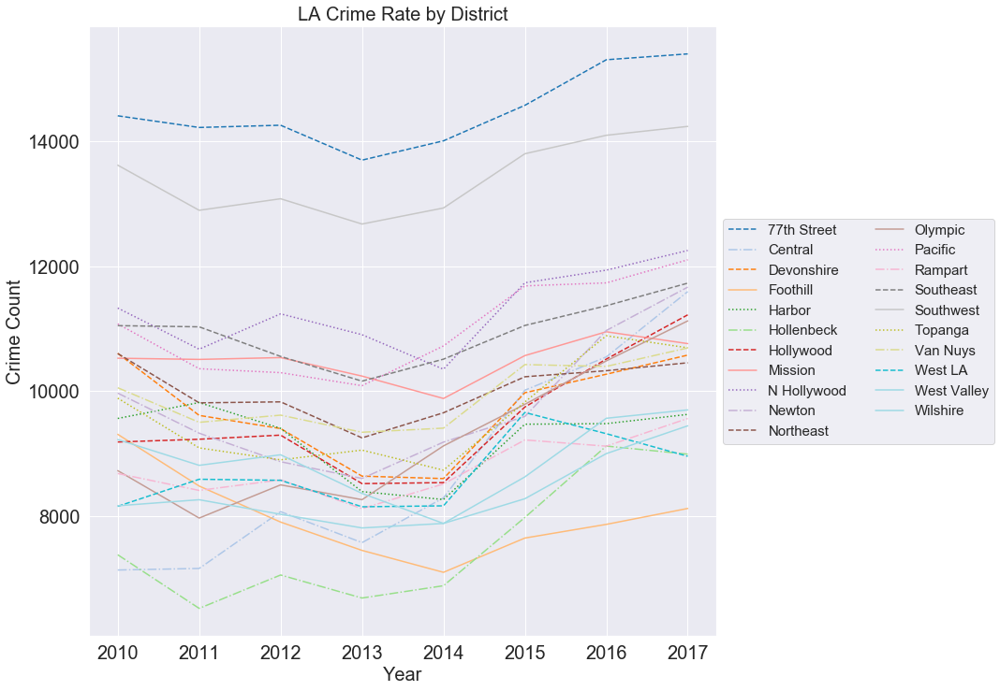

In [298]:
plot=yearly_data['Crime Count'].plot(by='Area Name',style=['--','-.','--','-',':','-.','--','-',':','-.','--','-',':','-.','--','-',':','-.','--','-','-',':','-.','--'],colormap='tab20',figsize=(12,12))
plot.legend(loc='center left', bbox_to_anchor=(1, 0.5),prop={'size': 15}, ncol=2,facecolor='inherit')
plt.ylabel('Crime Count',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.title('LA Crime Rate by District',fontsize=20)


Seems that 77th Street and Southwest districts are the most dangerous 
Hollenbeck, Central, Olympic, Hollywood and Newton Districts have rapid increases in crime 


Text(0.5,1,'Regions With Increasing and Decreasing Crime')

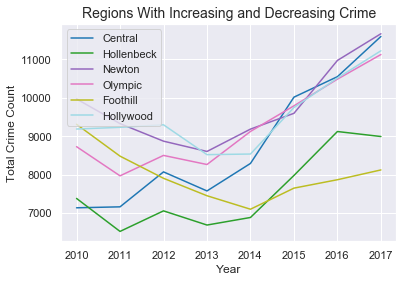

In [299]:
#Creating a separate graph for crime count in selected districts 
yearly_data['Crime Count'].plot(y=['Central','Hollenbeck','Newton','Olympic','Foothill','Hollywood'],colormap='tab20')
plt.legend(loc='upper left')
plt.xlabel('Year',fontsize=12)
plt.ylabel("Total Crime Count",fontsize=12)
plt.title('Regions With Increasing and Decreasing Crime',fontsize=14)

In [300]:
# Creating table with yearly crime counts segregated by types of crime 
yearly_bycrime=timed_data.drop(columns='Date Occurred_Time Occurred')
yearly_bycrime=yearly_bycrime[yearly_bycrime['Year']!=2018]

In [301]:
yearly_bycrime=yearly_bycrime.groupby(['Year','Area Name','Crime']).size().to_frame(name='Count')

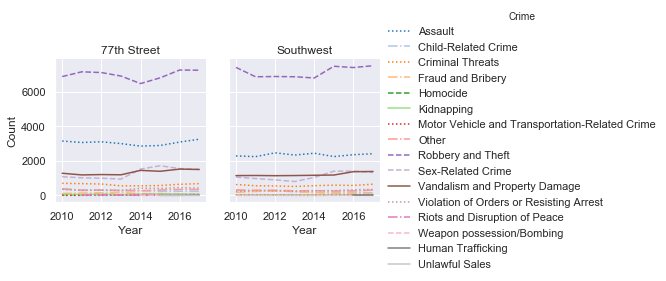

In [304]:
# Plotting crime coumt data for 77th Street and Southwest (split by crime count) 
most_dangerous=yearly_bycrime.reset_index()
most_dangerous.set_index(['Area Name'],inplace=True)
most_dangerous=most_dangerous.loc[['77th Street','Southwest']]
most_dangerous.reset_index(inplace=True)
g = sns.FacetGrid(most_dangerous, col="Area Name", hue="Crime",palette='tab20',hue_kws={'ls':[':','-.',':','-.','--','-',':','-.','--','--','-',':','-.','--','-','-',':']})
g.map(plt.plot, "Year", "Count")
g.add_legend()
g.set_titles("{col_name}")

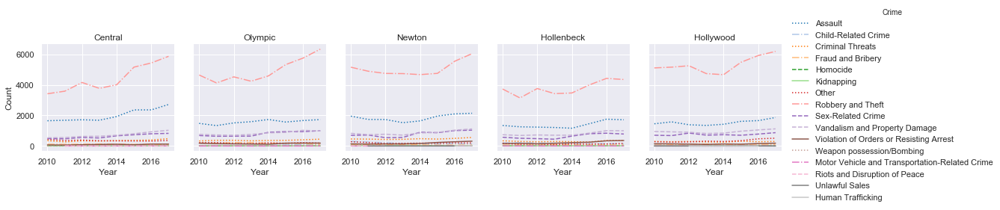

In [297]:
# Focus districts 

risingc_dist=yearly_bycrime.reset_index()
risingc_dist.set_index(['Area Name'],inplace=True)
risingc_dist=risingc_dist.loc[['Central','Olympic','Newton','Hollenbeck','Hollywood']]
risingc_dist.reset_index(inplace=True)
g = sns.FacetGrid(risingc_dist, col="Area Name", hue="Crime",palette='tab20',hue_kws={'ls':[':','-.',':','-.','--','-',':','-.','--','--','-',':','-.','--','-','-',':']})
g.map(plt.plot, "Year", "Count")
g.add_legend()
g.set_titles("{col_name}")

### What crimes happend at what premises ???

Text(0.5,0,'Premise')

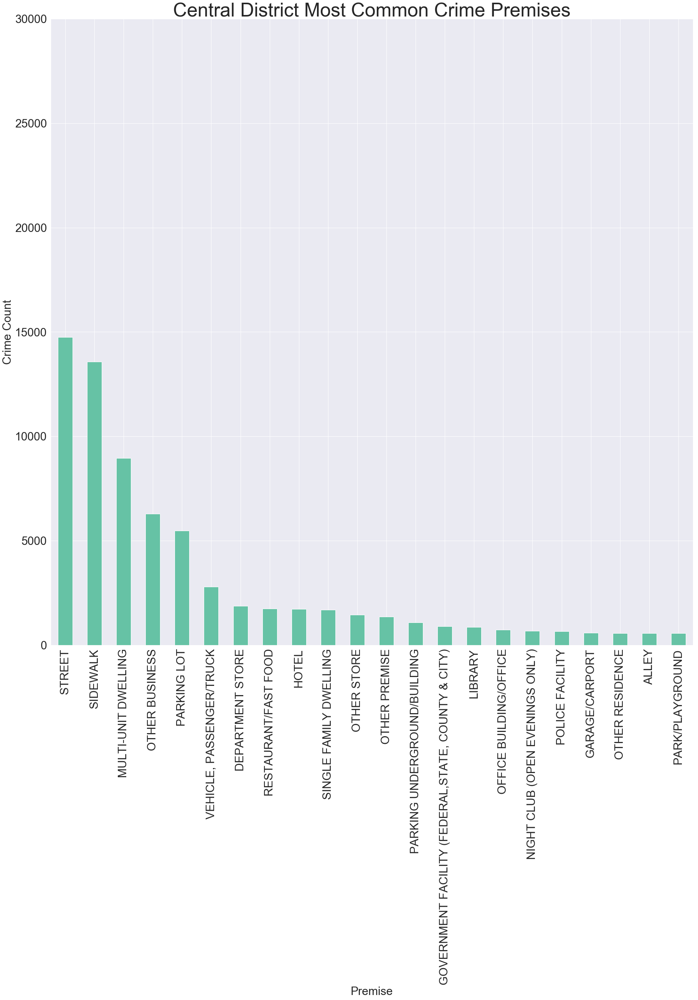

In [139]:
# Bar chart for Central District - crime count by crime 

area_premise=df.loc[:,['Premise Description','Area Name']]
central_premise=area_premise[area_premise['Area Name']=='Central']
central_premise=central_premise.drop(columns='Area Name')
central_premise=central_premise['Premise Description'].value_counts().to_frame('Count')
central_premise=central_premise[central_premise['Count']>500]
central_premise['Count'].plot(kind='bar',figsize=(30,30),colormap='Set2')
plt.title('Central District Most Common Crime Premises',fontsize=50)
plt.xticks(fontsize=30)
plt.ylim(0,30000)
plt.yticks(fontsize=30)
plt.ylabel('Crime Count',fontsize=30)
plt.xlabel('Premise',fontsize=30)


In [308]:
# Bar chart for Central District - primise vs. crime count stacked by crime type 
crime_by_premise=df.loc[:,['Area Name','Crime','Premise Description']]
crime_by_premise.set_index('Area Name',inplace=True)
crime_by_premise=crime_by_premise.loc[['Central','Olympic','Newton','Hollenbeck','Hollywood']]
central_crime_prem=crime_by_premise.loc['Central']
central_crime_prem.reset_index(inplace=True)
central_crime_prem=central_crime_prem.groupby(['Crime','Area Name','Premise Description']).size().to_frame('Count')
central_crime_prem.reset_index(inplace=True)
central_crime_prem.drop(columns='Area Name',inplace=True)
central_crime_prem.set_index(['Premise Description','Crime'],inplace=True)
central_crime_prem=central_crime_prem.unstack(level='Crime',fill_value=0)
# defining top premises in central districts 
central_premise=['STREET','SIDEWALK','MULTI-UNIT DWELLING','OTHER BUSINESS','PARKING LOT','VEHICLE, PASSENGER/TRUCK','DEPARTMENT STORE','RESTAURANT/FAST FOOD']
central_crime_prem['Count'].loc[central_premise].plot(kind='bar',stacked=True,colormap='tab20',figsize=(100,100)) 
plt.xticks(fontsize=120)
plt.yticks(fontsize=120)
plt.legend(loc='upper right',prop={'size':120})
plt.title('Central District',fontsize=200)
plt.xlabel('Premise',fontsize=200)
plt.tight_layout()

Text(0.5,0,'Premise')

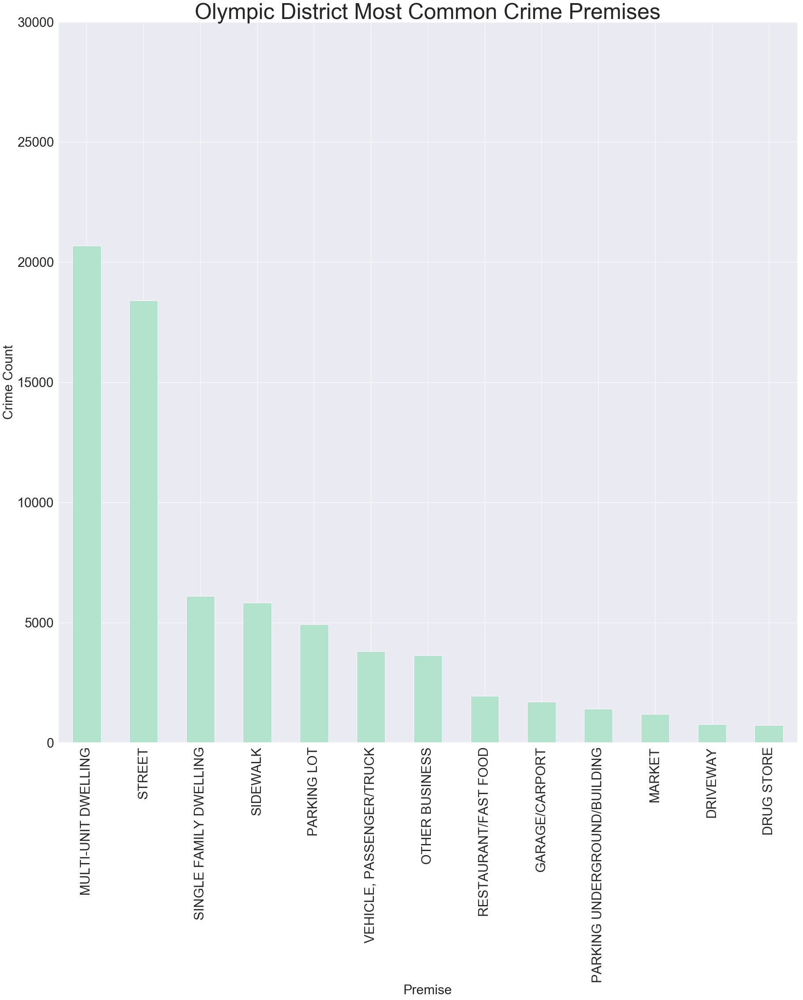

In [138]:
# Bar chart for Olympic District - crime count by crime
olympic_premise=area_premise[area_premise['Area Name']=='Olympic']
olympic_premise=olympic_premise.drop(columns='Area Name')
olympic_premise=olympic_premise['Premise Description'].value_counts().to_frame('Count')
olympic_premise=olympic_premise[olympic_premise['Count']>500]
olympic_premise['Count'].plot(kind='bar',figsize=(30,30),colormap='Pastel2')
plt.title('Olympic District Most Common Crime Premises',fontsize=50)
plt.xticks(fontsize=30)
plt.ylim(0,30000)
plt.yticks(fontsize=30)
plt.ylabel('Crime Count',fontsize=30)
plt.xlabel('Premise',fontsize=30)

In [132]:
# Bar chart for Olympic District - primise vs. crime count stacked by crime type 
olympic_crime_prem=crime_by_premise.loc['Olympic']
olympic_crime_prem.reset_index(inplace=True)
olympic_crime_prem=olympic_crime_prem.groupby(['Crime','Area Name','Premise Description']).size().to_frame('Count')
olympic_crime_prem.reset_index(inplace=True)
olympic_crime_prem.drop(columns='Area Name',inplace=True)
olympic_crime_prem.set_index(['Premise Description','Crime'],inplace=True)
olympic_crime_prem=olympic_crime_prem.unstack(level='Crime',fill_value=0)
olympic_premise=['MULTI-UNIT DWELLING','STREET','SINGLE FAMILY DWELLING','SIDEWALK','PARKING LOT','VEHICLE, PASSENGER/TRUCK','OTHER BUSINESS','RESTAURANT/FAST FOOD']
olympic_crime_prem['Count'].loc[olympic_premise].plot(kind='bar',stacked=True,colormap='tab20',figsize=(100,100)) 
plt.xticks(fontsize=120)
plt.yticks(fontsize=120)
plt.ylabel('Crime Count',fontsize=200)
plt.legend(loc='upper right',prop={'size':150})
plt.title('Olympic District',fontsize=200)
plt.xlabel('Premise',fontsize=200)
plt.tight_layout()

Text(0.5,0,'Premise')

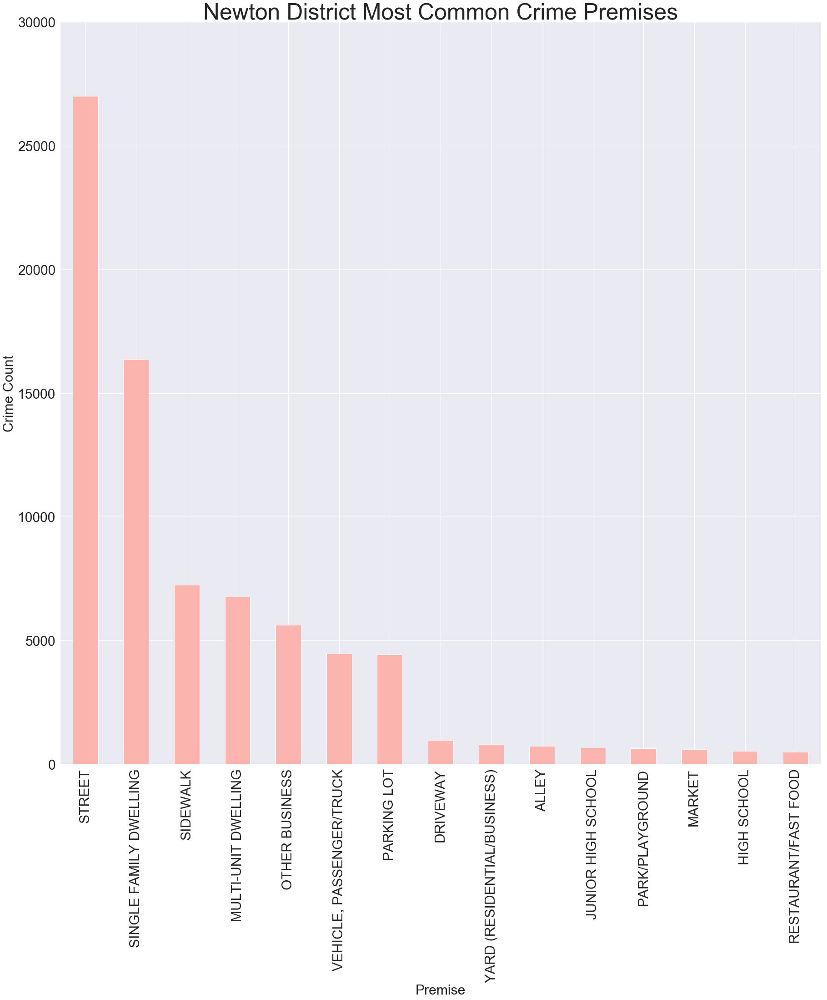

In [137]:
# Bar chart for Newton District - crime count by crime
newton_premise=area_premise[area_premise['Area Name']=='Newton']
newton_premise=newton_premise.drop(columns='Area Name')
newton_premise=newton_premise['Premise Description'].value_counts().to_frame('Count')
newton_premise=newton_premise[newton_premise['Count']>500]
newton_premise['Count'].plot(kind='bar',figsize=(30,30),colormap='Pastel1')
plt.title('Newton District Most Common Crime Premises',fontsize=50)
plt.xticks(fontsize=30)
plt.ylim(0,30000)
plt.yticks(fontsize=30)
plt.ylabel('Crime Count',fontsize=30)
plt.xlabel('Premise',fontsize=30)

Text(0,0.5,'Crime Count')

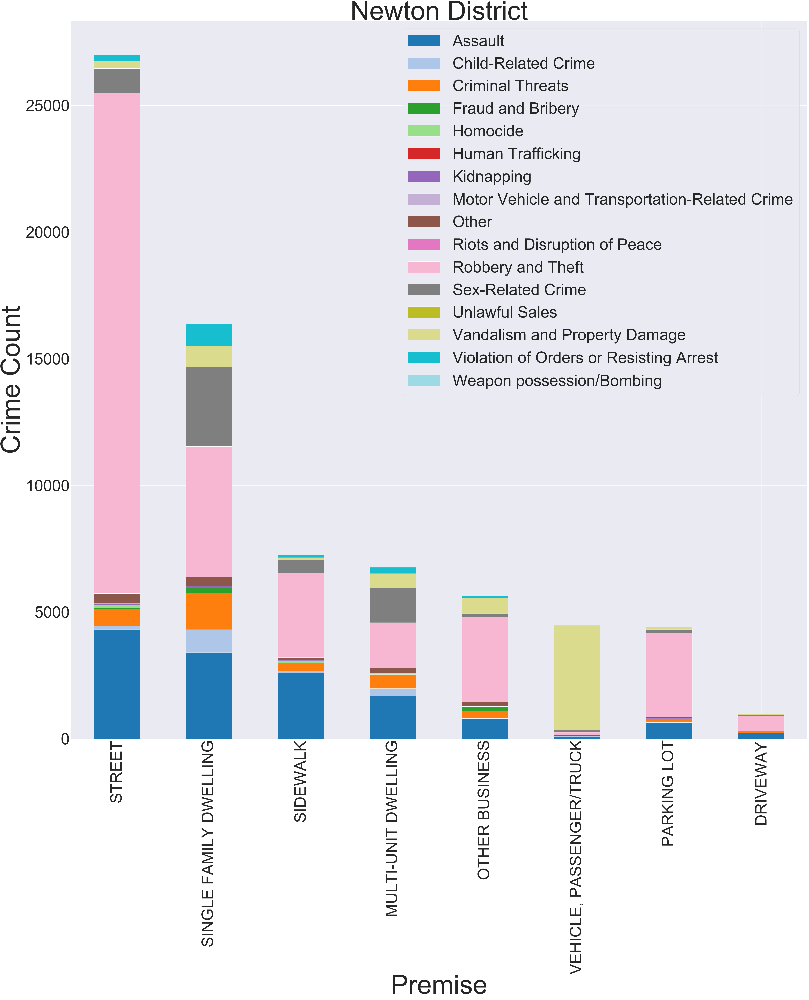

In [133]:
# Bar chart for Newton District - primise vs. crime count stacked by crime type 
newton_crime_prem=crime_by_premise.loc['Newton']
newton_crime_prem.reset_index(inplace=True)
newton_crime_prem=newton_crime_prem.groupby(['Crime','Area Name','Premise Description']).size().to_frame('Count')
newton_crime_prem.reset_index(inplace=True)
newton_crime_prem.drop(columns='Area Name',inplace=True)
newton_crime_prem.set_index(['Premise Description','Crime'],inplace=True)
newton_crime_prem=newton_crime_prem.unstack(level='Crime',fill_value=0)
newton_premise=['STREET','SINGLE FAMILY DWELLING','SIDEWALK','MULTI-UNIT DWELLING','OTHER BUSINESS','VEHICLE, PASSENGER/TRUCK','PARKING LOT','DRIVEWAY']
newton_crime_prem['Count'].loc[newton_premise].plot(kind='bar',stacked=True,colormap='tab20',figsize=(100,100)) 
plt.xticks(fontsize=120)
plt.yticks(fontsize=120)
plt.legend(loc='upper right',prop={'size':120})
plt.title('Newton District',fontsize=200)
plt.xlabel('Premise',fontsize=200)
plt.ylabel('Crime Count',fontsize=200)

Text(0.5,0,'Premise')

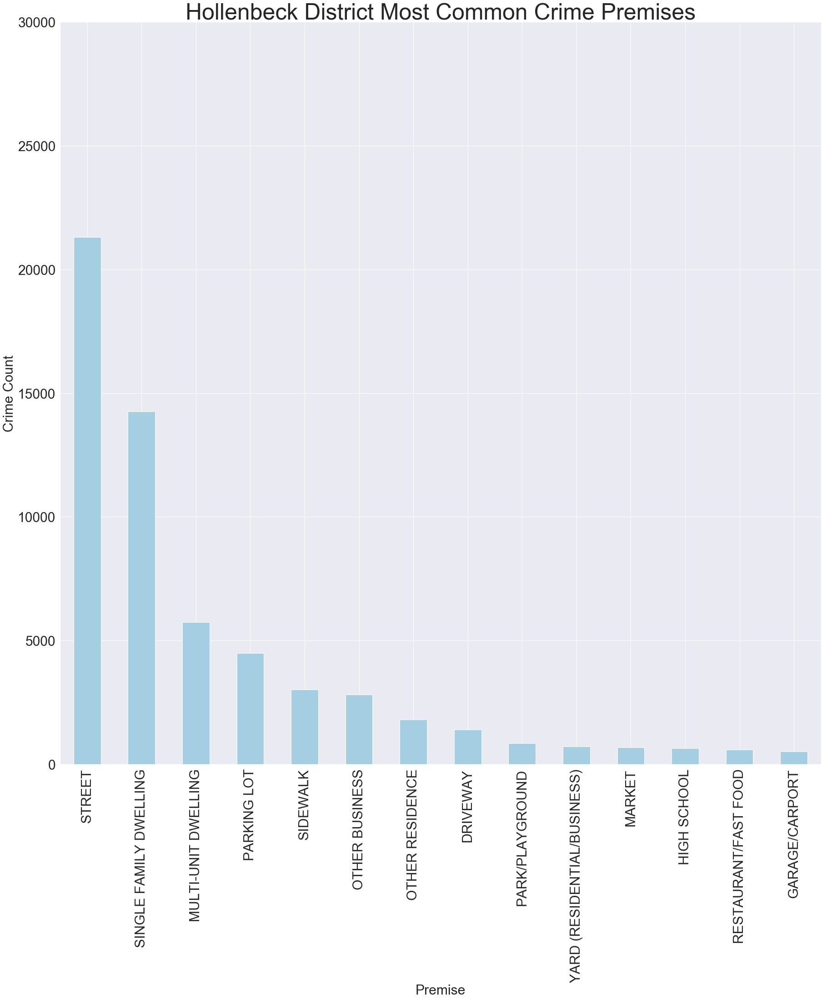

In [136]:
# Bar chart for Hollenbeck District - crime count by crime
hollenbeck_premise=area_premise[area_premise['Area Name']=='Hollenbeck']
hollenbeck_premise=hollenbeck_premise.drop(columns='Area Name')
hollenbeck_premise=hollenbeck_premise['Premise Description'].value_counts().to_frame('Count')
hollenbeck_premise=hollenbeck_premise[hollenbeck_premise['Count']>500]
hollenbeck_premise['Count'].plot(kind='bar',figsize=(30,30),colormap='Paired')
plt.title('Hollenbeck District Most Common Crime Premises',fontsize=50)
plt.xticks(fontsize=30)
plt.ylim(0,30000)
plt.yticks(fontsize=30)
plt.ylabel('Crime Count',fontsize=30)
plt.xlabel('Premise',fontsize=30)

Text(0,0.5,'Crime Count')

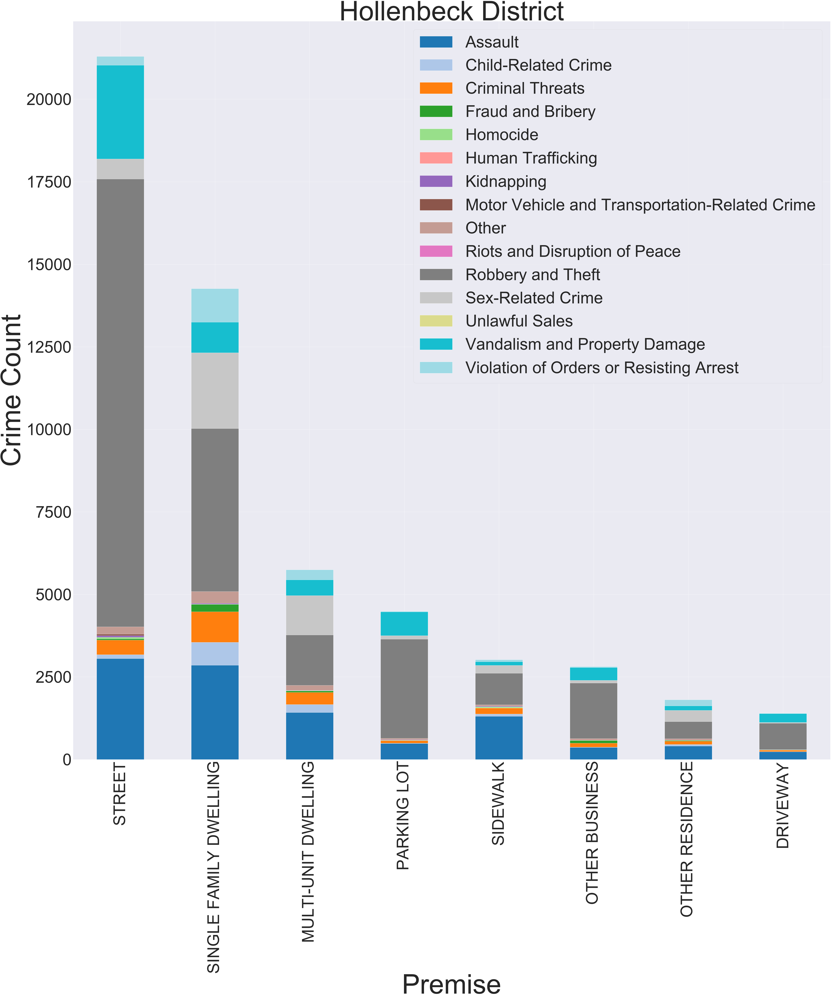

In [134]:
# Bar chart for Hollenbeck District - primise vs. crime count stacked by crime type 
hollen_crime_prem=crime_by_premise.loc['Hollenbeck']
hollen_crime_prem.reset_index(inplace=True)
hollen_crime_prem=hollen_crime_prem.groupby(['Crime','Area Name','Premise Description']).size().to_frame('Count')
hollen_crime_prem.reset_index(inplace=True)
hollen_crime_prem.drop(columns='Area Name',inplace=True)
hollen_crime_prem.set_index(['Premise Description','Crime'],inplace=True)
hollen_crime_prem=hollen_crime_prem.unstack(level='Crime',fill_value=0)
hollen_premise=['STREET','SINGLE FAMILY DWELLING','MULTI-UNIT DWELLING','PARKING LOT','SIDEWALK','OTHER BUSINESS','OTHER RESIDENCE','DRIVEWAY']
hollen_crime_prem['Count'].loc[hollen_premise].plot(kind='bar',stacked=True,colormap='tab20',figsize=(100,100)) 
plt.xticks(fontsize=120)
plt.yticks(fontsize=120)
plt.legend(loc='upper right',prop={'size':120})
plt.title('Hollenbeck District',fontsize=200)
plt.xlabel('Premise',fontsize=200)
plt.ylabel('Crime Count',fontsize=200)

Text(0.5,0,'Premise')

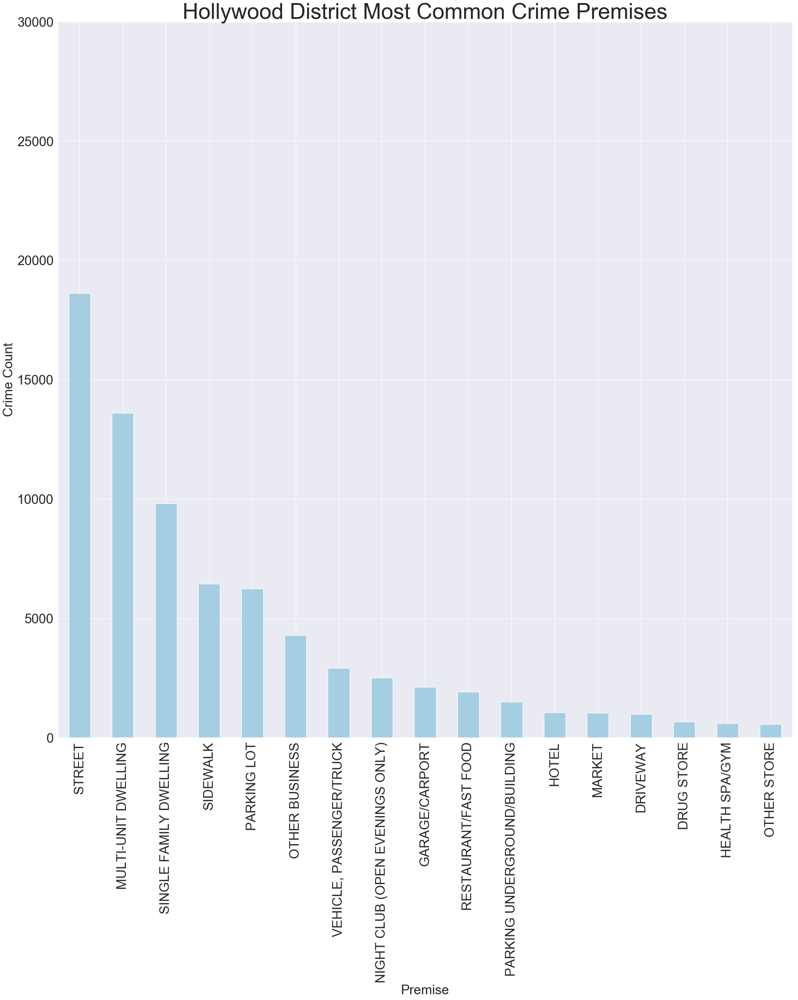

In [306]:
# Bar chart for Hollywood District - crime count by crime
hollywood_premise=area_premise[area_premise['Area Name']=='Hollywood']
hollywood_premise=hollywood_premise.drop(columns='Area Name')
hollywood_premise=hollywood_premise['Premise Description'].value_counts().to_frame('Count')
hollywood_premise=hollywood_premise[hollywood_premise['Count']>500]
hollywood_premise['Count'].plot(kind='bar',figsize=(30,30),colormap='Paired')
plt.title('Hollywood District Most Common Crime Premises',fontsize=50)
plt.xticks(fontsize=30)
plt.ylim(0,30000)
plt.yticks(fontsize=30)
plt.ylabel('Crime Count',fontsize=30)
plt.xlabel('Premise',fontsize=30)

Text(0,0.5,'Crime Count')

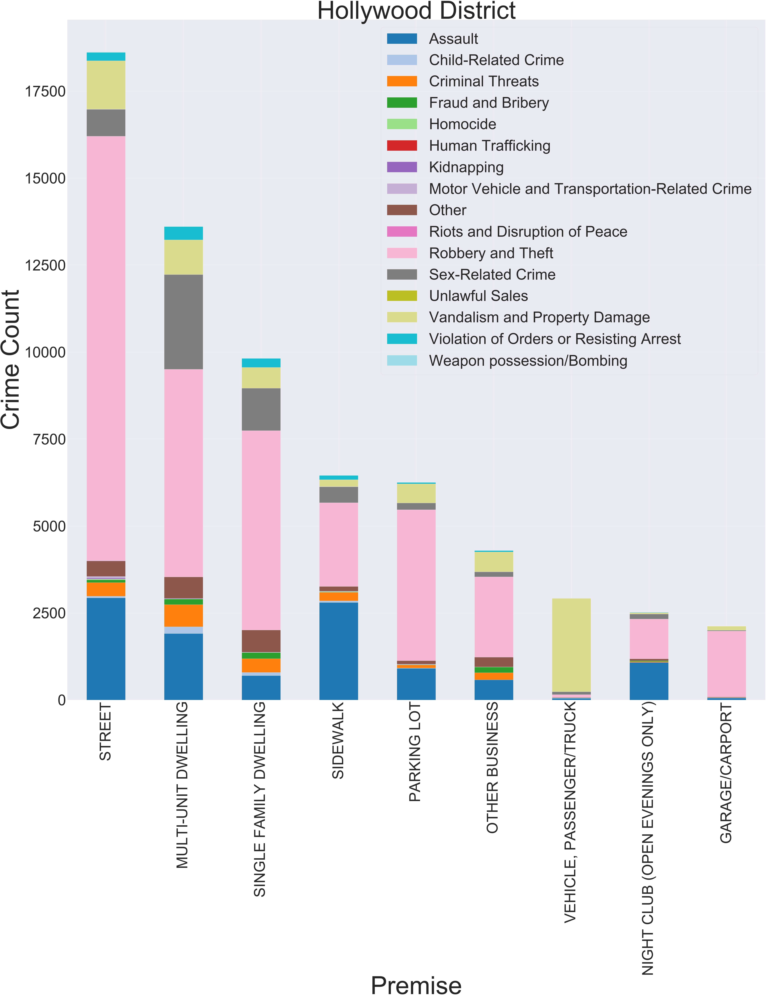

In [315]:
# Bar chart for Hollywood District - primise vs. crime count stacked by crime type 
holly_crime_prem=crime_by_premise.loc['Hollywood']
holly_crime_prem.reset_index(inplace=True)
holly_crime_prem=holly_crime_prem.groupby(['Crime','Area Name','Premise Description']).size().to_frame('Count')
holly_crime_prem.reset_index(inplace=True)
holly_crime_prem.drop(columns='Area Name',inplace=True)
holly_crime_prem.set_index(['Premise Description','Crime'],inplace=True)
holly_crime_prem=holly_crime_prem.unstack(level='Crime',fill_value=0)
holly_premise=['STREET','MULTI-UNIT DWELLING','SINGLE FAMILY DWELLING','SIDEWALK','PARKING LOT','OTHER BUSINESS','VEHICLE, PASSENGER/TRUCK','NIGHT CLUB (OPEN EVENINGS ONLY)','GARAGE/CARPORT']
holly_crime_prem['Count'].loc[holly_premise].plot(kind='bar',stacked=True,colormap='tab20',figsize=(100,100)) 
plt.xticks(fontsize=120)
plt.yticks(fontsize=120)
plt.legend(loc='upper right',prop={'size':120})
plt.title('Hollywood District',fontsize=200)
plt.xlabel('Premise',fontsize=200)
plt.ylabel('Crime Count',fontsize=200)

### Looking into the trend of continuing investigations. What is the count of open investigations by year?  

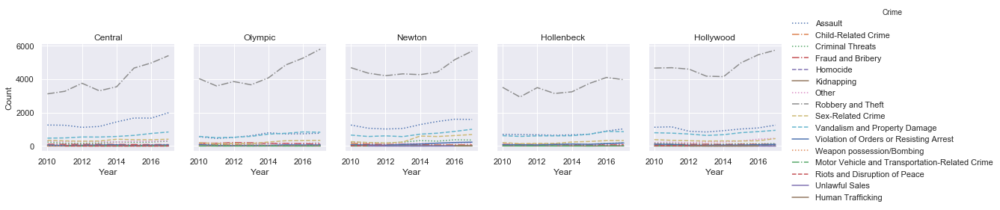

In [320]:
inv_cont=df.loc[:,['Date Occurred_Time Occurred','Crime','Status Description','Area Name']]
inv_cont=inv_cont[inv_cont['Status Description']=='Invest Cont']
inv_cont=inv_cont.set_index('Area Name')
inv_cont=inv_cont.loc[['Central','Olympic','Newton','Hollenbeck','Hollywood']]
inv_cont['Year']=inv_cont['Date Occurred_Time Occurred'].dt.year
inv_cont=inv_cont[inv_cont['Year']!=2018]
inv_cont.drop(columns=['Date Occurred_Time Occurred','Status Description'],inplace=True)
inv_cont=inv_cont.groupby(['Year','Area Name','Crime']).size().to_frame('Count')
inv_cont.reset_index(inplace=True)
g=sns.FacetGrid(inv_cont,col='Area Name',hue='Crime',palette='deep',hue_kws={'ls':[':','-.',':','-.','--','-',':','-.','--','--','-',':','-.','--','-','-',':']},col_order=['Central','Olympic','Newton','Hollenbeck','Hollywood'])
g.map(plt.plot,'Year','Count')
g.add_legend()
g.set_titles("{col_name}")


Open investigations seem to grow as crime grows

### Primary crimes seem to be 'Robbery and Theft' and 'Assault'

Which subcategories of those crimes are the most relevant? 
2013 seems to be a breaking point after which crime in the focus areas began to climb drastically. 
Are there certain subcategories of the two major crimes that grew significantly ? 

#### Central district, Robbery and Theft - left (Before 2013), right (after 2013)

Text(0.5,1,'Before 2013')

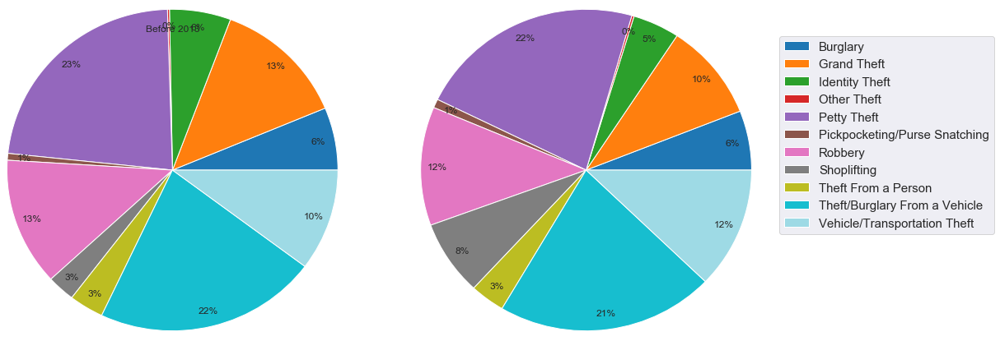

In [159]:
dcrime_by_district=df.loc[:,['Area Name','Crime','Crime_Detailed','Date Occurred_Time Occurred']]
dcrime_by_district['Date Occurred']=dcrime_by_district['Date Occurred_Time Occurred'].dt.year
dcrime_central=dcrime_by_district[(dcrime_by_district['Area Name']=='Central') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_central_before=dcrime_central[dcrime_central['Date Occurred']<2013]
dcrime_central_after=dcrime_central[dcrime_central['Date Occurred']>=2013]
dcrime_central_before=dcrime_central_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_central_after=dcrime_central_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_central_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_central_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_central_after.index)

#### Central district, Assault - left (Before 2013), right (after 2013)

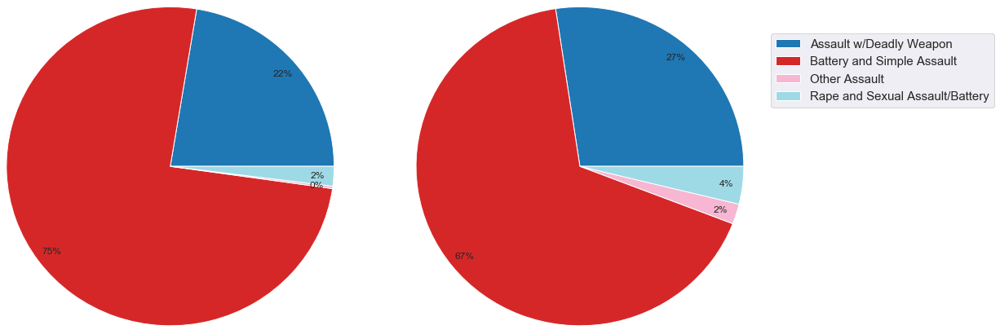

In [321]:
dcrime_central=dcrime_by_district[(dcrime_by_district['Area Name']=='Central') & (dcrime_by_district['Crime']=='Assault')]
dcrime_central_before=dcrime_central[dcrime_central['Date Occurred']<2013]
dcrime_central_after=dcrime_central[dcrime_central['Date Occurred']>=2013]
dcrime_central_before=dcrime_central_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_central_after=dcrime_central_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_central_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_central_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_central_after.index)

#### Olympic district, Robbery and Theft - left (Before 2013), right (after 2013)

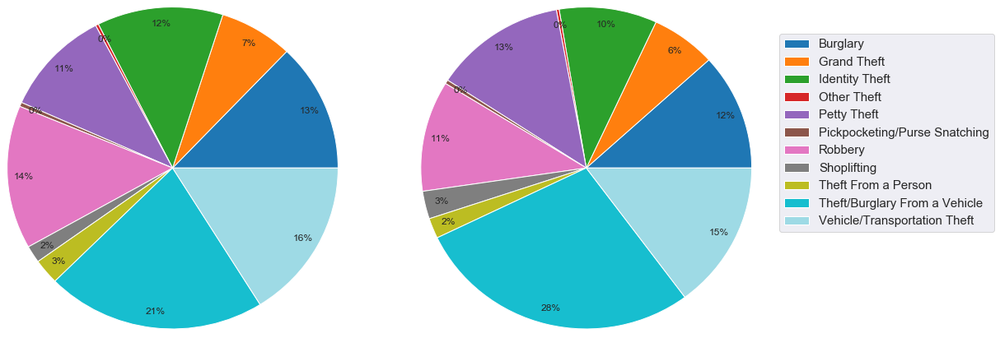

In [60]:
dcrime_olympic=dcrime_by_district[(dcrime_by_district['Area Name']=='Olympic') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_olympic_before=dcrime_olympic[dcrime_olympic['Date Occurred']<2013]
dcrime_olympic_after=dcrime_olympic[dcrime_olympic['Date Occurred']>=2013]
dcrime_olympic_before=dcrime_olympic_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_olympic_after=dcrime_olympic_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_olympic_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_olympic_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_olympic_after.index)

#### Olympic district, Assault - left (Before 2013), right (after 2013)

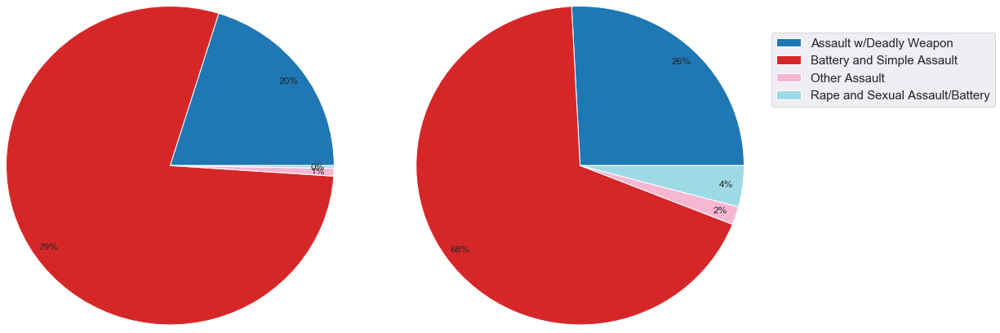

In [61]:
# Olympic district, Assault - left (Before 2013), right (after 2013)
dcrime_olympic=dcrime_by_district[(dcrime_by_district['Area Name']=='Olympic') & (dcrime_by_district['Crime']=='Assault')]
dcrime_olympic_before=dcrime_olympic[dcrime_olympic['Date Occurred']<2013]
dcrime_olympic_after=dcrime_olympic[dcrime_olympic['Date Occurred']>=2013]
dcrime_olympic_before=dcrime_olympic_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_olympic_after=dcrime_olympic_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_olympic_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_olympic_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_olympic_after.index)

#### Hollenbeck district, Robbery and Theft - left (Before 2013), right (after 2013)

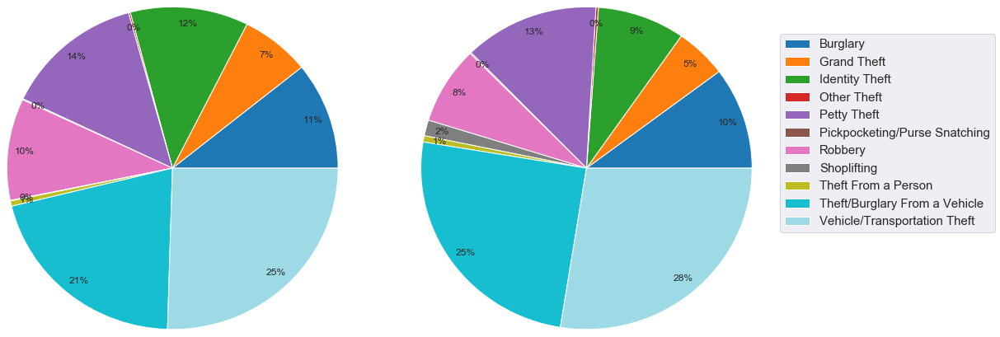

In [62]:
dcrime_hollenbeck=dcrime_by_district[(dcrime_by_district['Area Name']=='Hollenbeck') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_hollenbeck_before=dcrime_hollenbeck[dcrime_hollenbeck['Date Occurred']<2013]
dcrime_hollenbeck_after=dcrime_hollenbeck[dcrime_hollenbeck['Date Occurred']>=2013]
dcrime_hollenbeck_before=dcrime_hollenbeck_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_hollenbeck_after=dcrime_hollenbeck_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_hollenbeck_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_hollenbeck_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_hollenbeck_after.index)

#### Hollenbeck district, Assault - left (Before 2013), right (after 2013)

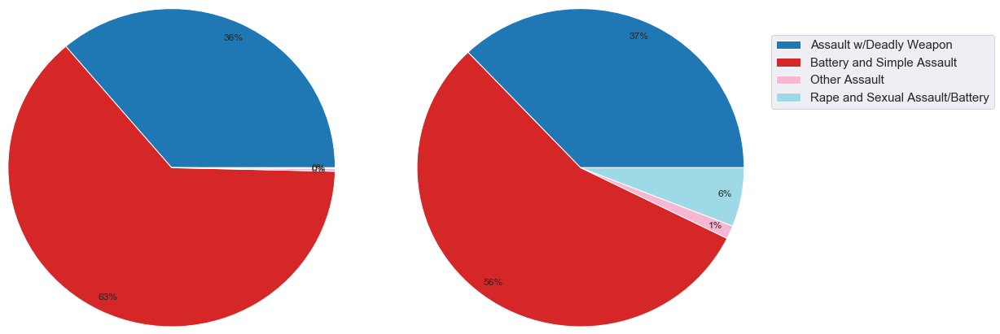

In [63]:
dcrime_hollenbeck=dcrime_by_district[(dcrime_by_district['Area Name']=='Hollenbeck') & (dcrime_by_district['Crime']=='Assault')]
dcrime_hollenbeck_before=dcrime_hollenbeck[dcrime_hollenbeck['Date Occurred']<2013]
dcrime_hollenbeck_after=dcrime_hollenbeck[dcrime_hollenbeck['Date Occurred']>=2013]
dcrime_hollenbeck_before=dcrime_hollenbeck_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_hollenbeck_after=dcrime_hollenbeck_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_hollenbeck_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_hollenbeck_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_hollenbeck_after.index)

#### Newton district, Robbery and Theft - left (Before 2013), right (after 2013)

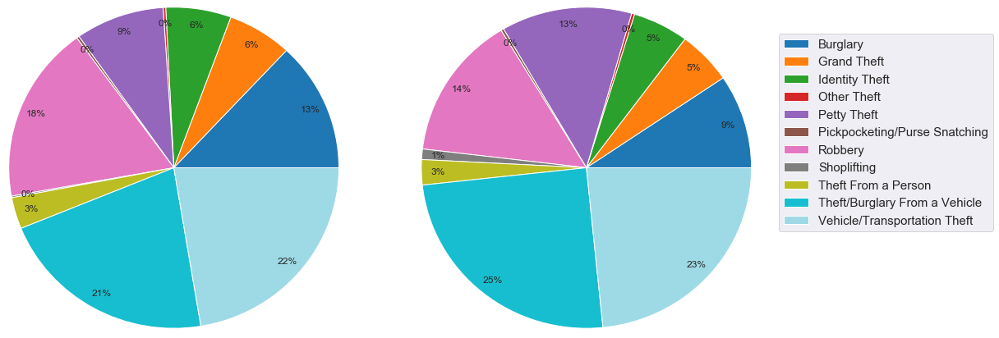

In [64]:
dcrime_newton=dcrime_by_district[(dcrime_by_district['Area Name']=='Newton') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_newton_before=dcrime_newton[dcrime_newton['Date Occurred']<2013]
dcrime_newton_after=dcrime_newton[dcrime_newton['Date Occurred']>=2013]
dcrime_newton_before=dcrime_newton_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_newton_after=dcrime_newton_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_newton_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_newton_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_newton_after.index)

#### Newton district, Assault - left (Before 2013), right (after 2013)

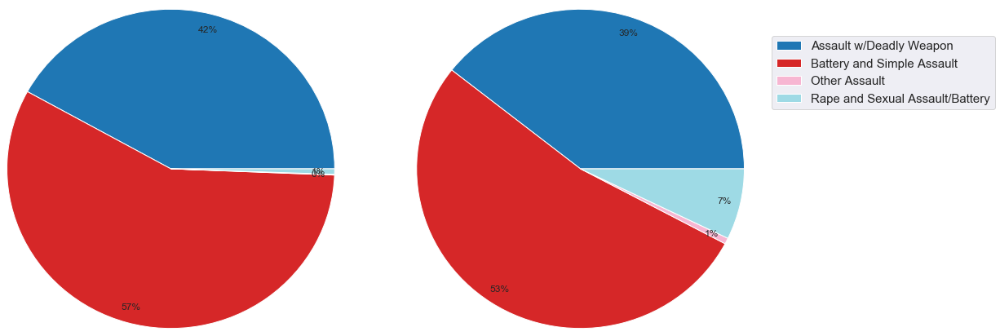

In [65]:
dcrime_newton=dcrime_by_district[(dcrime_by_district['Area Name']=='Newton') & (dcrime_by_district['Crime']=='Assault')]
dcrime_newton_before=dcrime_newton[dcrime_newton['Date Occurred']<2013]
dcrime_newton_after=dcrime_newton[dcrime_newton['Date Occurred']>=2013]
dcrime_newton_before=dcrime_newton_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_newton_after=dcrime_newton_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_newton_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_newton_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_newton_after.index)

#### Hollywood district, Robbery and Theft - left (Before 2013), right (after 2013)

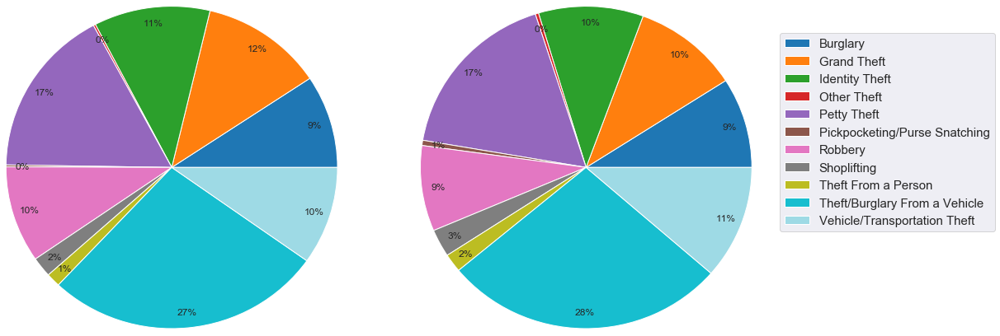

In [324]:

dcrime_holly=dcrime_by_district[(dcrime_by_district['Area Name']=='Hollywood') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_holly_before=dcrime_holly[dcrime_holly['Date Occurred']<2013]
dcrime_holly_after=dcrime_holly[dcrime_holly['Date Occurred']>=2013]
dcrime_holly_before=dcrime_holly_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_holly_after=dcrime_holly_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_holly_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_holly_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_holly_after.index)

#### Newton district, Assault - left (Before 2013), right (after 2013)

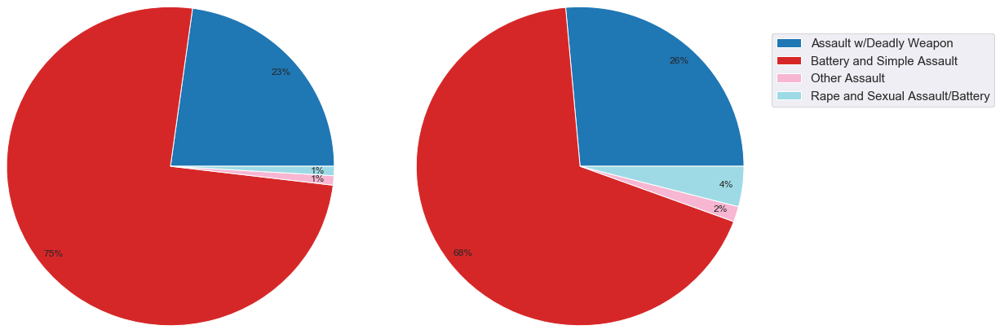

In [327]:
dcrime_holly=dcrime_by_district[(dcrime_by_district['Area Name']=='Hollywood') & (dcrime_by_district['Crime']=='Assault')]
dcrime_holly_before=dcrime_holly[dcrime_holly['Date Occurred']<2013]
dcrime_holly_after=dcrime_holly[dcrime_holly['Date Occurred']>=2013]
dcrime_holly_before=dcrime_holly_before.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_holly_after=dcrime_holly_after.groupby(['Crime_Detailed']).size().to_frame('Count')
figs,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,6))
dcrime_holly_after.plot.pie(ax=axes[1],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5)
dcrime_holly_before.plot.pie(ax=axes[0],y='Count',colormap='tab20',labels=None,autopct='%1.0f%%',pctdistance=.90, radius=1.5,legend=False)
figs.subplots_adjust(wspace=.5)
axes[1].legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.,prop={'size':15},labels=dcrime_holly_after.index)

#### 77th Street district, Robbery and Theft - did not appear to significantly increase after 2013

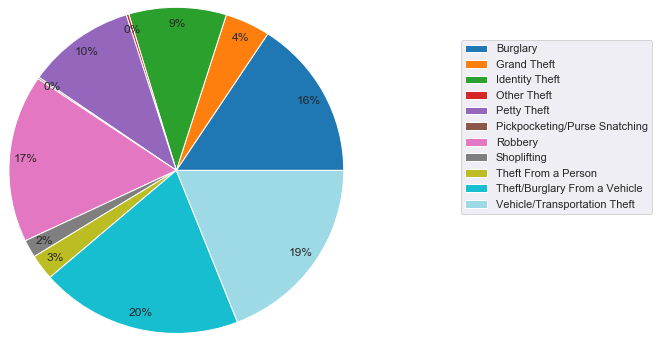

In [66]:
dcrime_77th=dcrime_by_district[(dcrime_by_district['Area Name']=='77th Street') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_77th=dcrime_77th.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_77th.plot.pie(y='Count',colormap='tab20',autopct='%1.0f%%',pctdistance=.90, radius=1.5,figsize=(5,5),labels=None)
plt.legend(bbox_to_anchor=(1.5,1),labels=dcrime_77th.index)

#### 77th Street district, Assault  - did not appear to significantly increase after 2013

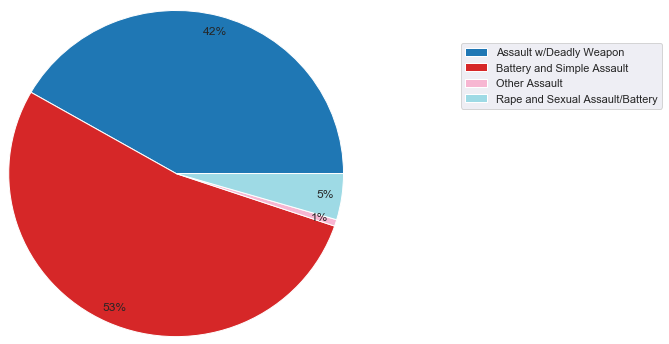

In [67]:
dcrime_77th=dcrime_by_district[(dcrime_by_district['Area Name']=='77th Street') & (dcrime_by_district['Crime']=='Assault')]
dcrime_77th=dcrime_77th.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_77th.plot.pie(y='Count',colormap='tab20',autopct='%1.0f%%',pctdistance=.90, radius=1.5,figsize=(5,5),labels=None)
plt.legend(bbox_to_anchor=(1.5,1),labels=dcrime_77th.index)

#### Southwest district, Robbery and Theft - did not appear to significantly increase after 2013

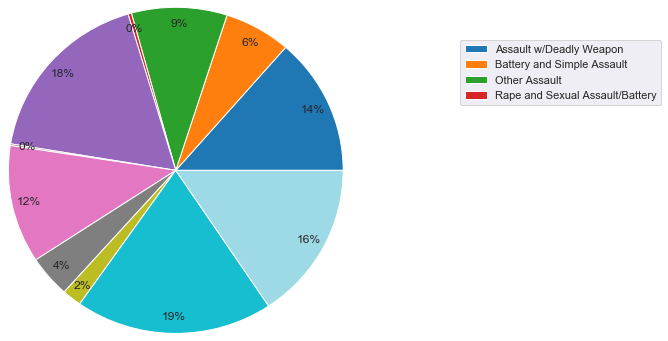

In [164]:
dcrime_southwest=dcrime_by_district[(dcrime_by_district['Area Name']=='Southwest') & (dcrime_by_district['Crime']=='Robbery and Theft')]
dcrime_southwest=dcrime_southwest.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_southwest.plot.pie(y='Count',colormap='tab20',autopct='%1.0f%%',pctdistance=.90, radius=1.5,figsize=(5,5),labels=None)
plt.legend(bbox_to_anchor=(1.5,1),labels=dcrime_77th.index)

#### Southwest district, Assault - did not appear to significantly increase after 2013

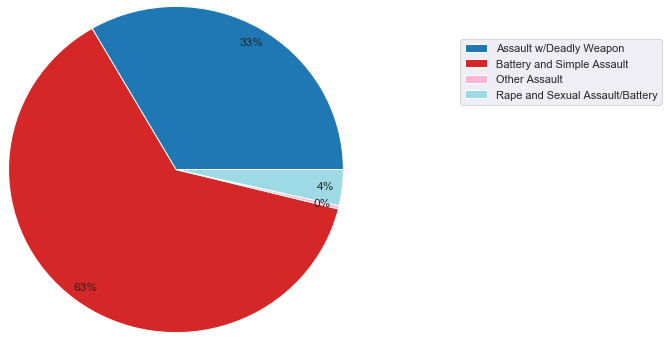

In [163]:
dcrime_southwest=dcrime_by_district[(dcrime_by_district['Area Name']=='Southwest') & (dcrime_by_district['Crime']=='Assault')]
dcrime_southwest=dcrime_southwest.groupby(['Crime_Detailed']).size().to_frame('Count')
dcrime_southwest.plot.pie(y='Count',colormap='tab20',autopct='%1.0f%%',pctdistance=.90, radius=1.5,figsize=(5,5),labels=None)
plt.legend(bbox_to_anchor=(1.5,1),labels=dcrime_77th.index)

### What are the peak times of crime in the 6 districts??? 

Looking at the crime trend is seems to peak throughout the day (10 am - 10 pm) and die down after 2 am. 

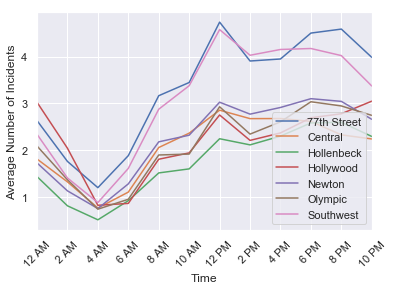

In [330]:
crime_time=df.loc[:,['Date Occurred_Time Occurred','Area Name','Crime Code Description']]
crime_time_rising=crime_time[(crime_time['Area Name']=='Central')| (crime_time['Area Name']=='Olympic')|(crime_time['Area Name']=='Newton') | (crime_time['Area Name']=='Hollenbeck')|(crime_time['Area Name']=='77th Street')|(crime_time['Area Name']=='Southwest')|(crime_time['Area Name']=='Hollywood')]
crime_time_rising.set_index(['Date Occurred_Time Occurred'],inplace=True)
crime_time_rising=crime_time_rising.groupby('Area Name')
crime_time_rising=crime_time_rising.resample('2H').count()
crime_time_rising.drop(columns='Area Name',inplace=True)
crime_time_rising.reset_index(inplace=True)
crime_time_rising['Time Occurred']=crime_time_rising['Date Occurred_Time Occurred'].dt.time
crime_time_rising.drop(columns='Date Occurred_Time Occurred',inplace=True)
crime_time_rising=crime_time_rising.groupby(['Time Occurred','Area Name'])['Crime Code Description'].mean().to_frame('Average')
crime_time_rising=crime_time_rising.unstack(level='Area Name')
crime_time_rising.plot()
ax=plt.gca() 
ax.set_xticks(crime_time_rising.index)
plt.xlim(crime_time_rising.index[0],crime_time_rising.index[-1])
ax.set_xticklabels(['12 AM','2 AM','4 AM','6 AM','8 AM','10 AM','12 PM','2 PM','4 PM','6 PM','8 PM','10 PM'],rotation=45)
plt.xlabel('Time')
plt.ylabel('Average Number of Incidents')
plt.legend(loc='lower right',labels=['77th Street','Central','Hollenbeck','Hollywood','Newton','Olympic','Southwest'])

### Which victim descents are the most prominent and what crime affect them?

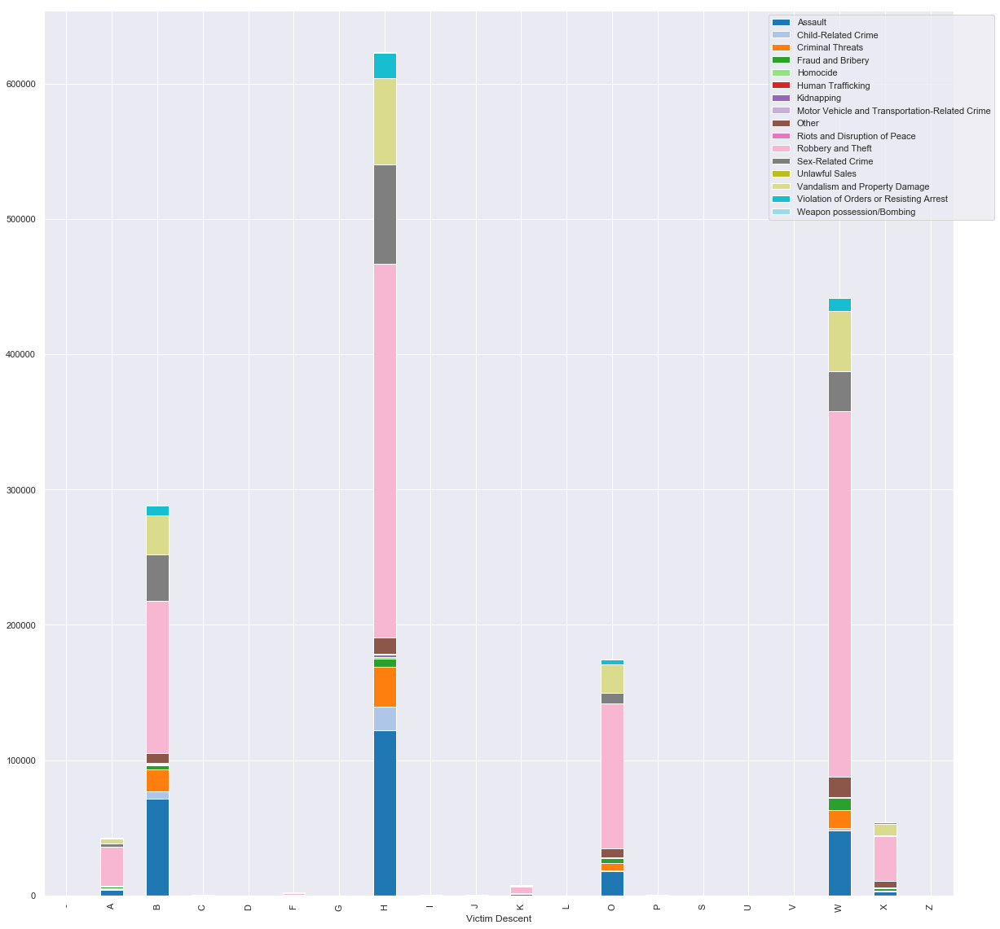

In [168]:
descent_crime=df.loc[:,['Victim Descent','Crime']]
descent_crime=descent_crime[descent_crime['Victim Descent']!='Missing']
descent_crime=descent_crime.groupby(['Victim Descent','Crime']).size().to_frame('Count')
descent_crime=descent_crime.unstack(level='Crime',fill_value=0)
descent_crime['Count'].plot(kind='bar',stacked=True,colormap='tab20',figsize=(20,20))
plt.legend(bbox_to_anchor=(1.05,1))

### Preprocessing the dataset for Machine Learning 

- Eliminating missing values  
- Converting variables to appropriate types and categories 



In [172]:
df_null=(df['Victim Age']=='Missing')|(df['Victim Sex']=='Missing') | (df['Victim Descent']=='Missing')
df_clean=df[~df_null]
df_clean.head()

,Date Occurred_Time Occurred,Area Name,Crime Code Description,Victim Age,Victim Sex,Victim Descent,Premise Description,Status Description,Location,Date Occurred,...,Hour_cos,Min_sin,Min_cos,Day_sin,Day_cos,Month_sin,Month_cos,Time Code,Crime,Crime_Detailed
0,2013-03-11 18:00:00,77th Street,INTIMATE PARTNER - SIMPLE ASSAULT,30,F,W,MULTI-UNIT DWELLING,Adult Other,"(33.9829, -118.3338)",2013-03-11,...,-1.836970e-16,0.0,1.0,0.790776,-0.612106,-0.500000,8.660254e-01,Evening,Sex-Related Crime,Rape and Sexual Assault/Battery
4,2014-01-04 23:00:00,Topanga,VANDALISM - MISDEAMEANOR ($399 OR UNDER),84,M,W,SINGLE FAMILY DWELLING,Invest Cont,"(34.2009, -118.6369)",2014-01-04,...,9.659258e-01,0.0,1.0,0.724793,0.688967,0.866025,-5.000000e-01,Night,Vandalism and Property Damage,Vandalism and Property Damage
5,2013-01-08 14:00:00,Central,CRIMINAL HOMICIDE,49,F,W,SINGLE FAMILY DWELLING,Adult Arrest,"(34.0591, -118.2412)",2013-01-08,...,-8.660254e-01,0.0,1.0,0.998717,-0.050649,-0.866025,-5.000000e-01,Afternoon,Homocide,Homocide
9,2013-01-15 08:00:00,Van Nuys,"EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)",27,F,O,OTHER BUSINESS,Invest Cont,"(34.2012, -118.4662)",2013-01-15,...,-5.000000e-01,0.0,1.0,0.101168,-0.994869,1.000000,1.194340e-15,Morning,Robbery and Theft,Grand Theft
12,2013-02-13 12:00:00,77th Street,THEFT PLAIN - PETTY ($950 & UNDER),42,M,H,PARKING LOT,Invest Cont,"(33.9651, -118.2783)",2013-02-13,...,-1.000000e+00,0.0,1.0,0.485302,-0.874347,0.500000,8.660254e-01,Morning,Robbery and Theft,Petty Theft


In [177]:
pd.options.mode.chained_assignment = None

In [179]:
df_clean['Victim Age']=pd.to_numeric(df_clean['Victim Age'])
df_clean[['Victim Sex','Victim Descent','Premise Description']]=df_clean[['Victim Sex','Victim Descent','Premise Description']].apply(lambda x : x.astype('category'))

In [181]:
df_clean.loc[:,'Location ']=df_clean.loc[:,'Location '].str.strip('(')
df_clean.loc[:,'Location ']=df_clean.loc[:,'Location '].str.strip(')')
df_clean['Location ']=df_clean['Location '].str.split(',')
df_clean['Latitude']=df_clean['Location '].apply(lambda x: x[0])
df_clean['Longitude']=df_clean['Location '].apply(lambda x: x[1])
df_clean[['Latitude','Longitude']]=df_clean[['Latitude','Longitude']].astype(float)
df_clean=(df_clean[~(df_clean['Longitude']==0)| ~(df_clean['Latitude']==0)])

### EDA for Machine Learning Purposes 

Is there an effect of the month on crime occurrance? 

Month does not seem to have much a difference, except for beginning and the end of the year. For simplicity will exclude this parameter. 

Text(0,0.5,'Crime Count')

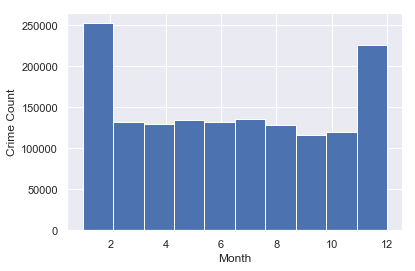

In [225]:
df_clean['Date Occurred_Time Occurred'].dt.month.plot(kind='hist')
plt.xlabel('Month')
plt.ylabel('Crime Count')

Day of the month doesn't seem to have much of a difference either (except at the end and the beginnig of the month)

Text(0,0.5,'Crime Count')

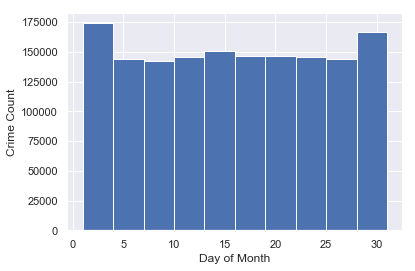

In [226]:
df_clean['Day_of_Month'].plot(kind='hist')
plt.xlabel('Day of Month')
plt.ylabel('Crime Count')

The hour of crime does seem to have a variable distribution (skewed to the later hours in the day)  

Text(0,0.5,'Crime Count')

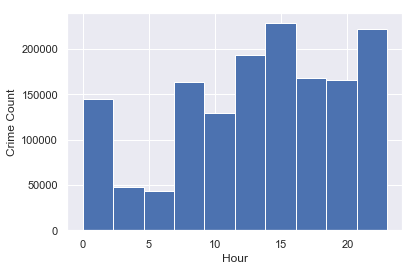

In [285]:
df_clean['Hour'].plot(kind='hist')
plt.xlabel('Hour')
plt.ylabel('Crime Count')

Minutes recorded for the crime seems to fall either into the ':00' or the ':30' timepoints 

Text(0.5,0,'Minute')

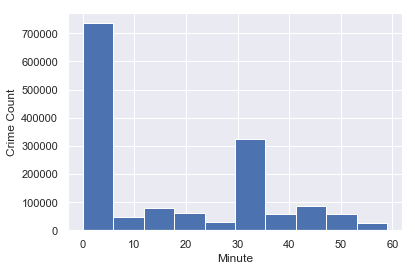

In [228]:
df_clean['Minute'].plot(kind='hist')
plt.ylabel('Crime Count')
plt.xlabel('Minute')

Age has a distribution skewed towards younger ages

Text(0,0.5,'Crime Count')

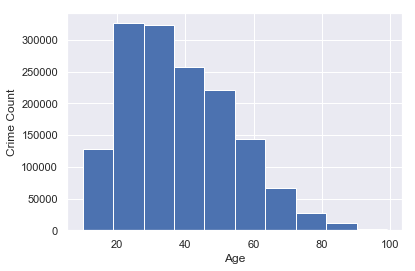

In [287]:
df_clean['Victim Age'].plot(kind='hist')
plt.xlabel('Age')
plt.ylabel('Crime Count')

Crime effect on the different 'Victim Sex' categories is described below. 

In [80]:
df_clean['Victim Sex'].value_counts()

M    753474
F    747712
X     11668
H        61
N         5
-         1
Name: Victim Sex, dtype: int64

Text(0,0.5,'Percent of Crime')

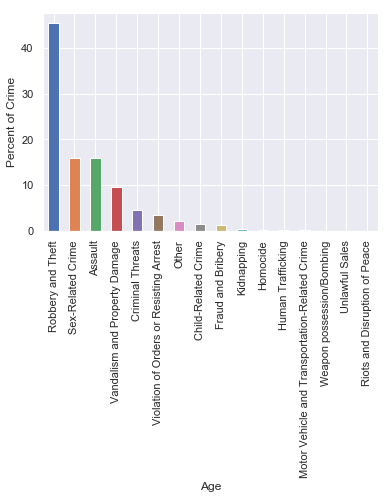

In [288]:
df_sex_female=df_clean[df_clean['Victim Sex']=='F']
((df_sex_female['Crime'].value_counts())/(df_sex_female['Crime'].value_counts().sum())*100).plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Percent of Crime')

Text(0,0.5,'Percent of Crime')

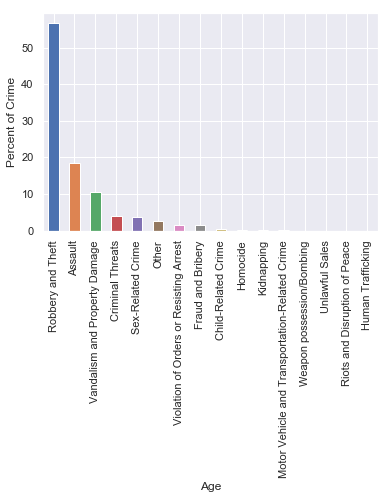

In [289]:
df_sex_male=df_clean[df_clean['Victim Sex']=='M']
((df_sex_male['Crime'].value_counts())/(df_sex_male['Crime'].value_counts().sum())*100).plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Percent of Crime')

Text(0,0.5,'Percent of Crime')

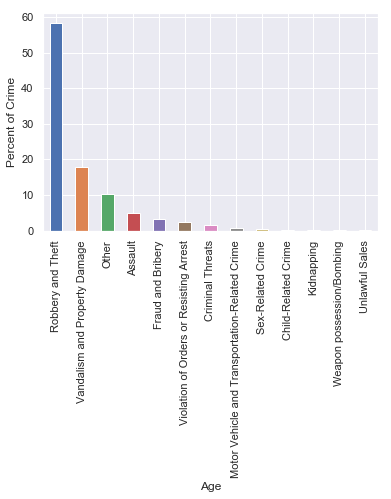

In [290]:
df_sex_x=df_clean[df_clean['Victim Sex']=='X']
count=(((df_sex_x['Crime'].value_counts())/(df_sex_x['Crime'].value_counts().sum())*100))
count.plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Percent of Crime')

Text(0,0.5,'Percent of Crime')

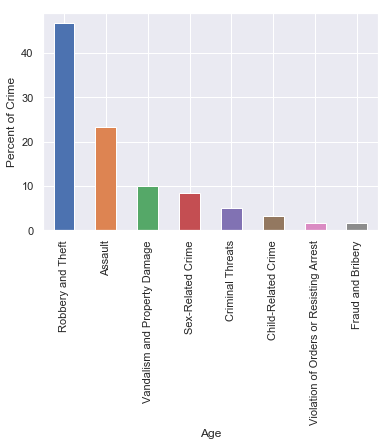

In [291]:
df_sex_h=df_clean[df_clean['Victim Sex']=='H']
((df_sex_h['Crime'].value_counts())/(df_sex_h['Crime'].value_counts().sum())*100).plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Percent of Crime')

### Machine Learning 

Loading the necessary packages... 

In [87]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import roc_curve
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 
from sklearn.utils import resample
from sklearn.metrics import roc_auc_score, accuracy_score 


/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Machine learning techniques here were focues on districts with rising crime only: Newton, Olympic, Central, Hollenbeck, and Hollywood districts. 

Features taken into consideration are 
- Latitude
- Longitude
- Min_sin
- Min_cos
- Victim Age
- Hour_sin
- Hour_cos
- Victim Sex
- Victim Descent

In [264]:
df_clean_full=df_clean[['Month_sin','Month_cos','Min_sin','Min_cos','Crime','Hour_sin','Hour_cos','Latitude','Longitude','Victim Age','Victim Sex','Victim Descent','Area Name']].copy()
df_clean_full=df_clean[(df_clean['Area Name']=='Olympic')|(df_clean['Area Name']=='Central')|(df_clean['Area Name']=='Newton')|(df_clean['Area Name']=='Hollenbeck')|(df_clean['Area Name']=='Hollywood')]
df_clean_full=df_clean_full[(df_clean_full['Crime']=='Assault')|(df_clean_full['Crime']=='Robbery and Theft')]
df_clean_full_y=df_clean_full[['Crime']]
df_clean_full=pd.get_dummies(df_clean_full[['Latitude','Longitude','Min_sin','Min_cos','Victim Age','Hour_sin','Hour_cos','Victim Sex','Victim Descent']])
df_clean_full=pd.concat([df_clean_full_y,df_clean_full],axis=1)

def dummy_creator(data):
    if data==('Assault'): 
        return 1
    else: 
        return 0 
    
df_clean_full['Crime']=df_clean_full['Crime'].apply(dummy_creator)
df_clean_full.head()

,Crime,Latitude,Longitude,Min_sin,Min_cos,Victim Age,Hour_sin,Hour_cos,Victim Sex_-,Victim Sex_F,...,Victim Descent_K,Victim Descent_L,Victim Descent_O,Victim Descent_P,Victim Descent_S,Victim Descent_U,Victim Descent_V,Victim Descent_W,Victim Descent_X,Victim Descent_Z
16,1,34.0431,-118.2536,-1.959435e-15,1.0,23.0,-0.500000,-0.866025,0,0,...,0,0,0,0,0,0,0,0,0,0
18,1,34.0352,-118.2583,0.000000e+00,1.0,18.0,-0.707107,-0.707107,0,1,...,0,0,0,0,0,0,0,0,0,0
19,0,34.0480,-118.2577,-1.715001e-14,1.0,25.0,-0.965926,-0.258819,0,0,...,0,0,0,0,0,0,0,0,0,0
23,1,34.0517,-118.2456,-9.797174e-16,1.0,20.0,-0.866025,0.500000,0,1,...,0,0,0,0,0,0,0,0,0,0
24,1,34.0435,-118.2471,-8.575004e-15,1.0,32.0,-0.258819,0.965926,0,1,...,0,0,0,0,0,0,0,0,0,0


Multiple machine learning models were utilized including: DecisionTreeClassifier, ExtraTreesClassifier, MLPClassifier, AdaBoostClassifier, RandomForestClassifier, and XGBClassifier. 

XGBClassifier showed the best performace and was used as the final model. 

xgb=XGBClassifier()  
param_grid={'n_estimators':[50,150],'max_depth':[5,10],'subsample':[.5,.6,.7,.8,.9]}  
xgb=GridSearchCV(xgb,param_grid=param_grid,cv=5)   
xgb.fit(X_train,y_train)  
xgb.best_params_   

Best parameters n_estimators: 150, max_depth: 10, subsample: .8   
model with 40 n_estimators yeilded the same result and therefore, 40 n_estimators were used in the following    calculations   


The two categries for classification ('Assault' and 'Robbery and Theft') were unbalanced and were fixed through upsampling  

In [331]:
majority=df_clean_full[df_clean_full['Crime']==0]
minority=df_clean_full[df_clean_full['Crime']==1]
print('majority class shape', len(majority))
print('minority class shape',len(minority))


majority class shape 149521
minority class shape 70000


In [332]:
majority_upscale=resample(majority,replace=False,n_samples=len(minority),random_state=42)

In [333]:
scaled_df=pd.concat([minority,majority_upscale])

##### Carrying out the XBGClassification... 

In [276]:
X_scaled=scaled_df.drop(columns='Crime').values
Y_scaled=scaled_df['Crime'].values 

Creating test and train sets ...

In [277]:
X_train_s,X_test_s,y_train_s,y_test_s = train_test_split(X_scaled,Y_scaled,test_size=.3, random_state=42,stratify=Y_scaled)

Fitting the model ...

In [278]:
xgb_s=XGBClassifier(n_estimators=40,max_depth=10,eta=.3,subsample=.8)
xgb_s.fit(X_train_s,y_train_s)
xgb_s.score(X_test_s,y_test_s)
y_pred_s=xgb_s.predict(X_test_s)

ROC/AUC score 

In [338]:
# ROC/AUC score 
y_pred_proba_s=xgb_s.predict_proba(X_test_s)[:,1]
print('ROC/AUC Score: ',roc_auc_score(y_test_s,y_pred_proba_s)*100)

ROC/AUC Score:  73.65153854875282


ROC curve

Text(0.5,1,'ROC curve')

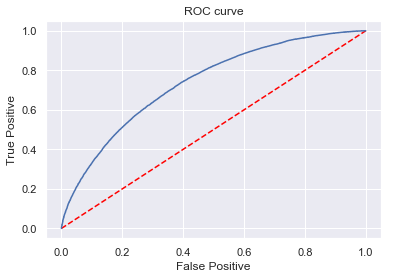

In [283]:
fpr,tpr,thresholds=roc_curve(y_test_s,y_pred_proba_s)
plt.plot([0,1],[0,1],'k--',color='red')
plt.plot(fpr,tpr)
plt.xlabel('False Positive')
plt.ylabel('True Positive')
plt.title('ROC curve')

Confusion Matrix

In [284]:
 xgb_df_s=pd.DataFrame({'true':y_test_s,'predicted':y_pred_s})
pd.crosstab(xgb_df_s['true'],xgb_df_s['predicted'])

predicted,0,1
true,,
0,13505,7495
1,6304,14696


The above machine learning can used to predict the crime ('Assault' or 'Robbery and Theft') based on several features in the rising crime areas of LA: Newton, Olympic, Central, Hollenbeck and Hollywood. 
ROC/AUC of tested model is 73%. To achive better performace, addition of more predictive features is necessary.